In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
train = pd.read_csv('./train.csv').drop_duplicates()
test = pd.read_csv('./test.csv')
test_ids = pd.read_csv('./test_ids.csv')

In [26]:
test

,time_stamp,contentid,user_action,sellingprice,product_name,brand_id,brand_name,businessunit,product_gender,category_id,...,Level3_Category_Id,Level3_Category_Name,gender,unique_id,type,month,dayOfMonth,dayofWeek,hour,date
0,2020-12-01 00:46:25+00:00,55075555.0,visit,89.99,Kadın Pembe Kareli Uçları Saçaklı Uzun Atkı 17...,1867.0,PIECES,Kadın A,Kadın,382.0,...,382.0,Atkı,NaN,108,test,12,1,Tuesday,0,2020-12-01
1,2020-12-03 19:26:19+00:00,32026013.0,visit,27.11,12835 Siyah Bere,33496.0,Axesoire,Diğer Aksesuarlar,Kadın,384.0,...,384.0,Bere,NaN,108,test,12,3,Thursday,19,2020-12-03
2,2020-11-12 21:55:33+00:00,4237521.0,visit,169.90,K 909 Perfection Kırmızı Saç Düzleştirici Saç ...,11022.0,King,Kişisel Bakım Aletleri,Kadın,865.0,...,865.0,Saç Düzleştirici,NaN,108,test,11,12,Thursday,21,2020-11-12
3,2020-11-02 02:07:38+00:00,33388105.0,visit,59.90,Pratik Isıtıcı + 1 Adet 200g Pudralı,25522.0,İnci Ağda,Kişisel Bakım,NaN,2431.0,...,1542.0,Ağda & Tüy Dökücü,NaN,108,test,11,2,Monday,2,2020-11-02
4,2020-11-19 18:07:42+00:00,32433838.0,visit,38.99,Atkı,842.0,Koton,Kadın A,Kadın,382.0,...,382.0,Atkı,NaN,108,test,11,19,Thursday,18,2020-11-19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2324809,2020-12-08 22:42:09+00:00,39832331.0,visit,0.00,3 Katlı Telli Cerrahi Maske 1 Kutu 50 Adet Kut...,972528.0,masktak,Sağlık,NaN,4025.0,...,4025.0,Medikal Maske,NaN,7509,test,12,8,Tuesday,22,2020-12-08
2324810,2020-12-08 22:42:14+00:00,46129448.0,basket,71.10,Yumuşak Elastik Kulaklı Maske 100 Adet,33938.0,Evony,Sağlık,NaN,4025.0,...,4025.0,Medikal Maske,NaN,7509,test,12,8,Tuesday,22,2020-12-08
2324811,2020-12-08 22:42:16+00:00,46881661.0,visit,39.29,Yumuşak Elastik Kulaklı 3 Katlı Cerrahi Maske ...,33938.0,Evony,Sağlık,NaN,4025.0,...,4025.0,Medikal Maske,NaN,7509,test,12,8,Tuesday,22,2020-12-08
2324812,2020-12-08 22:42:07+00:00,43524099.0,basket,0.00,50 Adet Siyah Tek Kullanımlık Lastikli Telli 3...,961001.0,Commando,Sağlık,NaN,4025.0,...,4025.0,Medikal Maske,NaN,7509,test,12,8,Tuesday,22,2020-12-08


In [248]:
train.head(3).T

,0,1,2
time_stamp,2020-12-02 22:26:14.023000+00:00,2020-12-08 23:15:04.603000+00:00,2020-12-05 16:19:01.157000+00:00
contentid,39918893.0,3558544.0,31292729.0
user_action,favorite,favorite,favorite
sellingprice,3099.0,3079.0,3999.0
product_name,PerfectCare 600 EW6F449ST A+++ 9 KG 1400 Devir...,WW90J5475FW A+++ 1400 Devir 9 kg Çamaşır Makinesi,KM 9711 A++ 9 kg Çamaşır Kurutma Makinesi
brand_id,8511.0,3228.0,10989.0
brand_name,Electrolux,Samsung,Vestel
businessunit,Beyaz Eşya,Beyaz Eşya,Beyaz Eşya
product_gender,Unisex,NaN,Unisex
category_id,1272.0,1272.0,1276.0


In [17]:
test.head(3).T

,0,1,2
time_stamp,2020-12-01T00:46:25Z,2020-12-03T19:26:19Z,2020-11-12T21:55:33Z
contentid,55075555.0,32026013.0,4237521.0
user_action,visit,visit,visit
sellingprice,89.99,27.11,169.9
product_name,Kadın Pembe Kareli Uçları Saçaklı Uzun Atkı 17...,12835 Siyah Bere,K 909 Perfection Kırmızı Saç Düzleştirici Saç ...
brand_id,1867.0,33496.0,11022.0
brand_name,PIECES,Axesoire,King
businessunit,Kadın A,Diğer Aksesuarlar,Kişisel Bakım Aletleri
product_gender,Kadın,Kadın,Kadın
category_id,382.0,384.0,865.0


In [ ]:
train['time_stamp'] = pd.to_datetime(train['time_stamp'])

train.loc[:,'month'] = train.loc[:,'time_stamp'].dt.strftime('%m')
train.loc[:,'dayOfMonth'] = train.loc[:,'time_stamp'].dt.strftime('%d')
train.loc[:,'dayofWeek'] = train.loc[:,'time_stamp'].dt.day_name()
train.loc[:,'hour'] = train.loc[:,'time_stamp'].dt.strftime('%H')
train.loc[:,'date'] = train.loc[:,'time_stamp'].dt.strftime('%Y-%m-%d')
train['hour'] = (train['hour']).astype(int)
train['dayOfMonth'] = (train['dayOfMonth']).astype(int)
train['month'] = (train['month']).astype(int)

train['date'] = train['time_stamp'].dt.date
train['date'] = pd.to_datetime(train['date'])

In [22]:
test['time_stamp'] = pd.to_datetime(test['time_stamp'])

test.loc[:,'month'] = test.loc[:,'time_stamp'].dt.strftime('%m')
test.loc[:,'dayOfMonth'] = test.loc[:,'time_stamp'].dt.strftime('%d')
test.loc[:,'dayofWeek'] = test.loc[:,'time_stamp'].dt.day_name()
test.loc[:,'hour'] = test.loc[:,'time_stamp'].dt.strftime('%H')
test.loc[:,'date'] = test.loc[:,'time_stamp'].dt.strftime('%Y-%m-%d')
test['hour'] = (test['hour']).astype(int)
test['dayOfMonth'] = (test['dayOfMonth']).astype(int)
test['month'] = (test['month']).astype(int)

test['date'] = test['time_stamp'].dt.date
test['date'] = pd.to_datetime(test['date'])

In [31]:
train.user_action.value_counts(dropna=False).head(15)

visit       2827388
search      1932734
favorite     396576
basket       265274
order         71296
Name: user_action, dtype: int64

In [18]:
test.user_action.value_counts().head(15)

visit       1210149
search       801985
favorite     178786
basket       106744
order         27150
Name: user_action, dtype: int64

In [19]:
test.Level1_Category_Name.value_counts().head(15)

Giyim                       1036942
Ev & Mobilya                 376747
Ayakkabı                     239799
Aksesuar                     155003
Kozmetik & Kişisel Bakım     125843
Süpermarket                  106172
Elektronik                   100130
Yaşam                         99270
Anne & Bebek & Çocuk          42389
Spor & Outdoor                40342
Name: Level1_Category_Name, dtype: int64

In [29]:
train.product_gender.value_counts(dropna=False).head(15)

Kadın     2841958
Unisex    1459890
NaN        621972
Erkek      569448
Name: product_gender, dtype: int64

In [38]:
train[['unique_id', 'gender']].drop_duplicates().gender.value_counts(dropna=False).head(15)

F    3679
M    1939
Name: gender, dtype: int64

In [72]:
train.brand_name.value_counts(dropna=False)

TRENDYOLMİLLA     599699
Koton             184011
LC Waikiki        169010
DeFacto            76596
Happiness İst.     75433
                   ...  
TÜRELİ GİYİM           1
Isımat                 1
BLACK CONCEPT          1
miss slim easy         1
B'LOCK                 1
Name: brand_name, Length: 33333, dtype: int64

In [75]:
train.Level1_Category_Name.value_counts(dropna=False)

Giyim                       2450653
Ev & Mobilya                 921736
Ayakkabı                     508360
Aksesuar                     363618
Kozmetik & Kişisel Bakım     323510
Elektronik                   247494
Süpermarket                  246607
Yaşam                        246522
Spor & Outdoor                96296
Anne & Bebek & Çocuk          82834
NaN                            5638
Name: Level1_Category_Name, dtype: int64

In [391]:
train.businessunit.value_counts(dropna=False)

Kadın A                               566603
Kadın B                               553513
PL Woman                              533900
Sofra & Mutfak                        287820
Branded Shoes B                       244010
Kids & Baby Fashion                   233735
Ev Dekorasyon                         154555
Ev Tekstil                            143833
Sportswear                            129567
İç Giyim                              127875
Branded Shoes A                       113900
Makyaj                                112576
Ev Giyim                               95838
Takı                                   93302
Cilt Bakım                             89271
Erkek B                                86092
Cep Telefonu & Aksesuarları            80879
Sağlık                                 79370
Salon &Mutfak Mobilya                  76636
Çanta & Valiz                          75263
Hobi                                   69795
GAS Denim                              65956
Elektrikli

In [ ]:
train['size'] = train['time_stamp'].groupby(train['time_stamp']).transform('count')

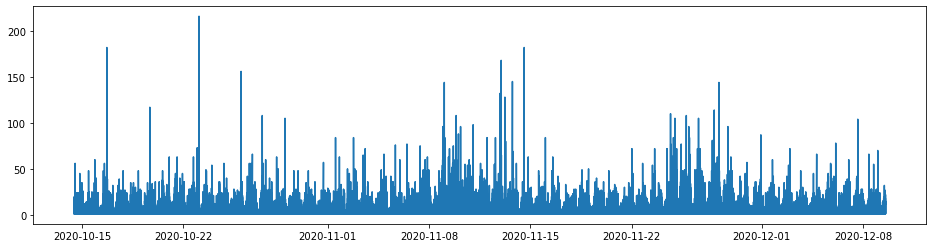

In [97]:
plt.figure(figsize=(16,4))
plt.plot(train.groupby('time_stamp').size())

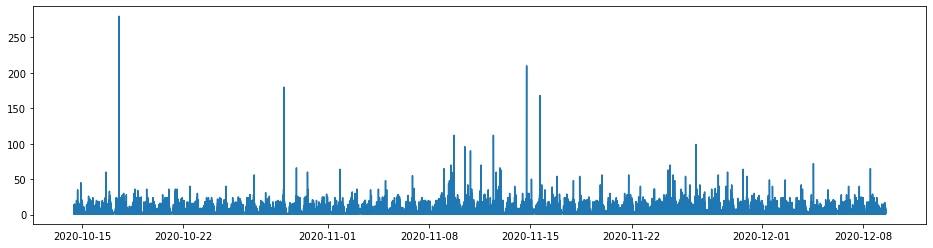

In [111]:
plt.figure(figsize=(16,4))
plt.plot(test.groupby('time_stamp').size())

In [130]:
# 3991 Male, 7396 Female, 4259 Male ,7613 Male galerici, 6714 (Kategoriden bir anne ? ), 1228 Male (Yalan)
# 6400 Male bilmek imkansız,3922 Zorrr, 6225 imkansız, 7471 (bakılan distinct kategori sayısı ? ), 4108
# ürünle ilgili her şey na 
pd.set_option('display.max_rows', None)
pd.set_option('display.max_column', None)

train[train['unique_id']==3991].sort_values('date')
#pd.reset_option('display.max_rows')


,time_stamp,contentid,user_action,sellingprice,product_name,brand_id,brand_name,businessunit,product_gender,category_id,Level1_Category_Id,Level1_Category_Name,Level2_Category_Id,Level2_Category_Name,Level3_Category_Id,Level3_Category_Name,gender,unique_id,type,month,dayOfMonth,dayofWeek,hour,date
5166963,2020-10-14 22:35:35+00:00,35793920.0,search,79.99,Siyah Dantelli Örme Pijama Takımı THMSS20PT0134,40.0,TRENDYOLMİLLA,PL Homewear,Kadın,563.0,522.0,Giyim,2870.0,Ev Giyim,561.0,Pijama,M,3991,train,10,14,Wednesday,22,2020-10-14
5166935,2020-10-14 22:35:10+00:00,48755368.0,search,68.99,Kadın Beyaz Yıldızlı Pijama Set,972445.0,the DIFFerent,Ev Giyim,Kadın,563.0,522.0,Giyim,2870.0,Ev Giyim,561.0,Pijama,M,3991,train,10,14,Wednesday,22,2020-10-14
5166836,2020-10-17 01:42:56+00:00,44297621.0,search,79.99,Bordo Sırt Detaylı Spor Tulum TWOAW21TU0016,40.0,TRENDYOLMİLLA,PL Woman,Kadın,546.0,522.0,Giyim,1192.0,Salopet & Tulum,546.0,Tulum,M,3991,train,10,17,Saturday,1,2020-10-17
5166866,2020-10-17 02:10:52+00:00,37533660.0,search,89.90,Özel Bölgesi Açık Seksi Tasarım Vücut Çorabı,369451.0,Cicişim,Fantezi Giyim,Kadın,3102.0,522.0,Giyim,3095.0,Fantezi Giyim,3096.0,Fantezi İç Giyim,M,3991,train,10,17,Saturday,2,2020-10-17
5166897,2020-10-17 01:45:26+00:00,45798535.0,search,76.99,Kadın Siyah V Yaka Salas Tulum,35127.0,Baroness,Kadın B,Kadın,546.0,522.0,Giyim,1192.0,Salopet & Tulum,546.0,Tulum,M,3991,train,10,17,Saturday,1,2020-10-17
5166868,2020-10-17 01:44:00+00:00,46089441.0,search,59.99,Askılı Tulum,970382.0,TİRE MODA,Kadın B,Kadın,546.0,522.0,Giyim,1192.0,Salopet & Tulum,546.0,Tulum,M,3991,train,10,17,Saturday,1,2020-10-17
5166869,2020-10-17 01:34:13+00:00,50069275.0,search,99.99,Bordo Örme Pijama Takımı THMAW21PT0509,40.0,TRENDYOLMİLLA,PL Homewear,Kadın,563.0,522.0,Giyim,2870.0,Ev Giyim,561.0,Pijama,M,3991,train,10,17,Saturday,1,2020-10-17
5166870,2020-10-17 01:39:45+00:00,46690904.0,search,64.99,Siyah Şerit Aksesuar Detaylı Örme Pijama Takım...,40.0,TRENDYOLMİLLA,PL Homewear,Kadın,563.0,522.0,Giyim,2870.0,Ev Giyim,561.0,Pijama,M,3991,train,10,17,Saturday,1,2020-10-17
5166947,2020-10-17 01:37:59+00:00,40422506.0,search,64.99,Pembe Leopar Desenli Crop Bluzlu Pijama Takımı...,40.0,TRENDYOLMİLLA,PL Homewear,Kadın,563.0,522.0,Giyim,2870.0,Ev Giyim,561.0,Pijama,M,3991,train,10,17,Saturday,1,2020-10-17
5166936,2020-10-17 01:41:09.181000+00:00,52514554.0,favorite,118.97,Kadın Siyah Waffle Pijama Takımı,8605.0,Penti,Ev Giyim,Kadın,563.0,522.0,Giyim,2870.0,Ev Giyim,561.0,Pijama,M,3991,train,10,17,Saturday,1,2020-10-17


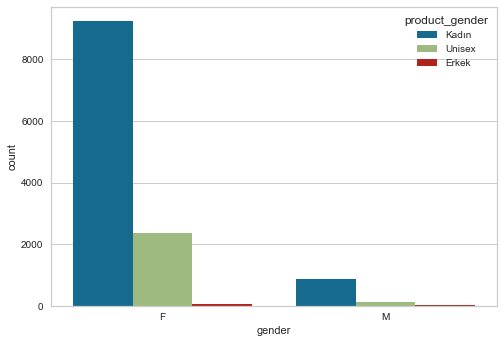

In [395]:
# Pass the axes into seaborn
sns.countplot(x="gender", hue = "product_gender",data=train[train["businessunit"]=='Mücevher']);

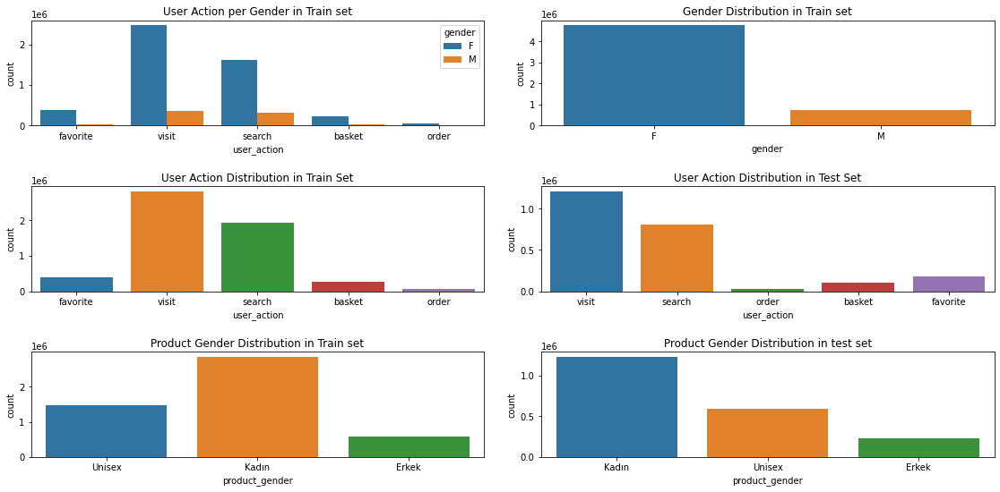

In [150]:
fig, axes = plt.subplots(3, 2, figsize=(16, 8))

# Use the axes for plotting
# axes[0,0].plot(years, apples, 's-b')
axes[0,0].set_title('User Action per Gender in Train set')
sns.countplot(x="user_action", hue="gender", data=train, ax=axes[0,0])


# Pass the axes into seaborn
axes[0,1].set_title('Gender Distribution in Train set')
sns.countplot(x="gender", data=train, ax=axes[0,1]);

# Pass the axes into seaborn
axes[1,0].set_title('User Action Distribution in Train Set')
sns.countplot(x="user_action", data=train, ax=axes[1,0]);

# Pass the axes into seaborn
axes[1,1].set_title('User Action Distribution in Test Set')
sns.countplot(x="user_action", data=test, ax=axes[1,1])


# Pass the axes into seaborn
axes[2,0].set_title('Product Gender Distribution in Train set')
sns.countplot(x="product_gender", data=train, ax=axes[2,0]);

# Pass the axes into seaborn
axes[2,1].set_title('Product Gender Distribution in test set')
sns.countplot(x="product_gender", data=test, ax=axes[2,1]);

plt.tight_layout(pad=2);

<AxesSubplot:title={'center':'User Action Distribution in Test Set'}, xlabel='user_action', ylabel='count'>

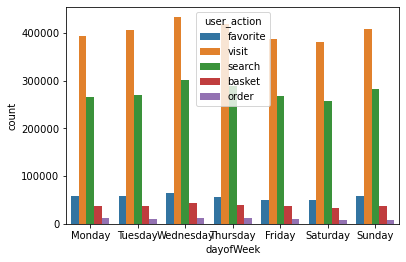

In [11]:
ax = sns.countplot(x="dayofWeek", data=train, hue = 'user_action', order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.tight_layout(pad=2);

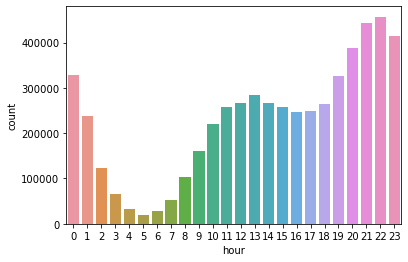

In [33]:
ax = sns.countplot(x="hour", data=train, order = range(0,24))


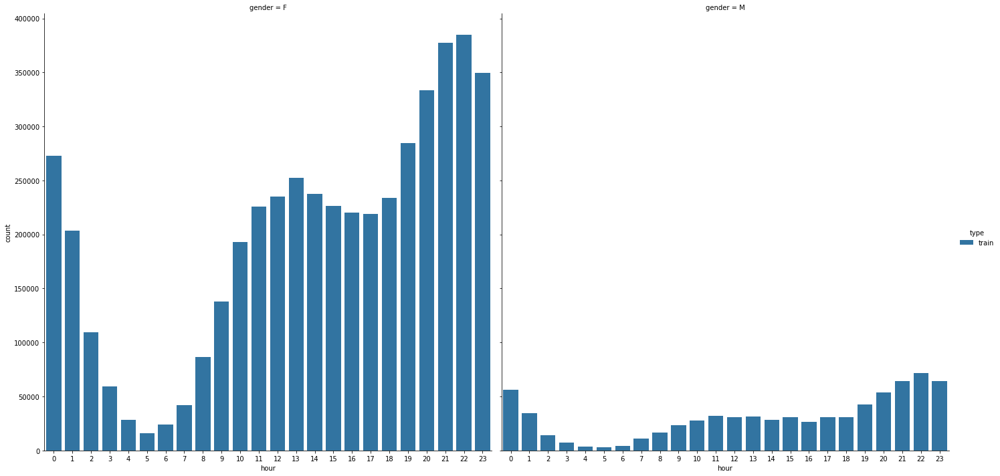

In [35]:
g = sns.catplot(x="hour", hue="type", col="gender",
                data=train, kind="count",
                height=10, aspect=1, order = range(0,24) );

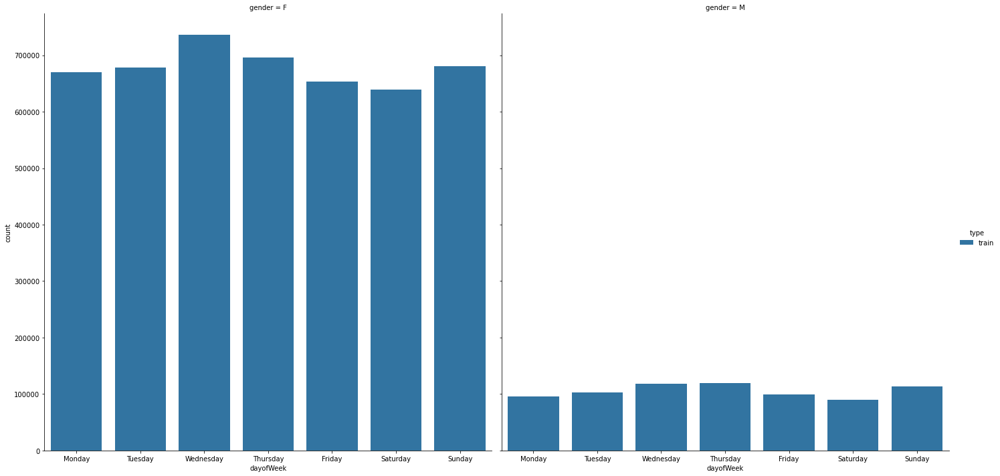

In [37]:
g = sns.catplot(x="dayofWeek", hue="type", col="gender",
                data=train, kind="count",
                height=10, aspect=1, order =  ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'] );

In [7]:
train['date'] = train['time_stamp'].dt.date
train['date'] = pd.to_datetime(train['date'])

In [8]:
train.dtypes

time_stamp              datetime64[ns, UTC]
contentid                           float64
user_action                          object
sellingprice                        float64
product_name                         object
brand_id                            float64
brand_name                           object
businessunit                         object
product_gender                       object
category_id                         float64
Level1_Category_Id                  float64
Level1_Category_Name                 object
Level2_Category_Id                  float64
Level2_Category_Name                 object
Level3_Category_Id                  float64
Level3_Category_Name                 object
gender                               object
unique_id                             int64
type                                 object
month                                 int64
dayOfMonth                            int64
dayofWeek                            object
hour                            

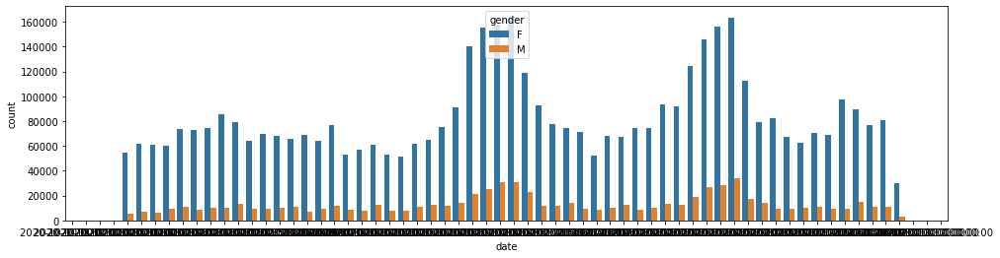

In [88]:
plt.figure(figsize=(16,4))

ax = sns.countplot(x="date", data=train,hue = 'gender',order = pd.date_range(start="2020-10-10",end="2020-12-12"))

<Figure size 1800x288 with 0 Axes>

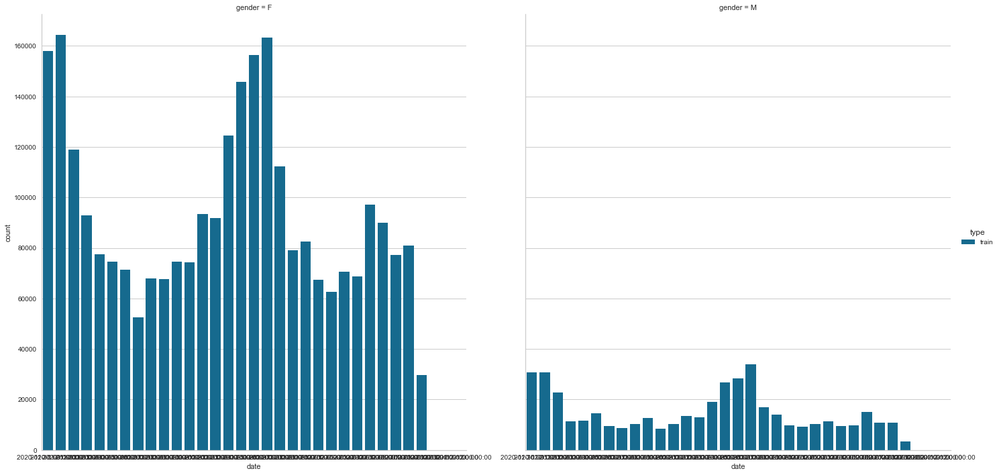

In [189]:
plt.figure(figsize=(25,4))

g = sns.catplot(x="date", hue="type", col="gender",
                data=train, kind="count",
                height=10, aspect=1 ,order = pd.date_range(start="2020-11-10",end="2020-12-12"));

<Figure size 1800x288 with 0 Axes>

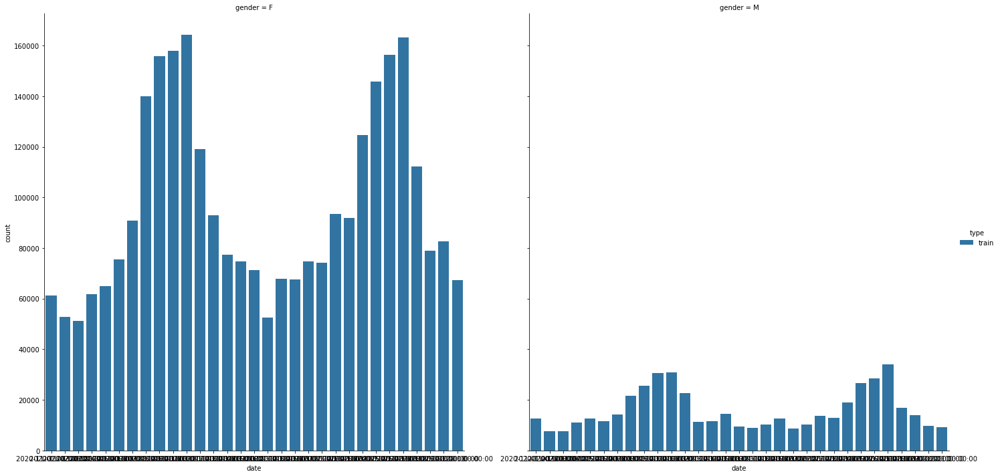

In [89]:
plt.figure(figsize=(25,4))

g = sns.catplot(x="date", hue="type", col="gender",
                data=train, kind="count",
                height=10, aspect=1 ,order = pd.date_range(start="2020-11-01",end="2020-12-01"));

<Figure size 1800x288 with 0 Axes>

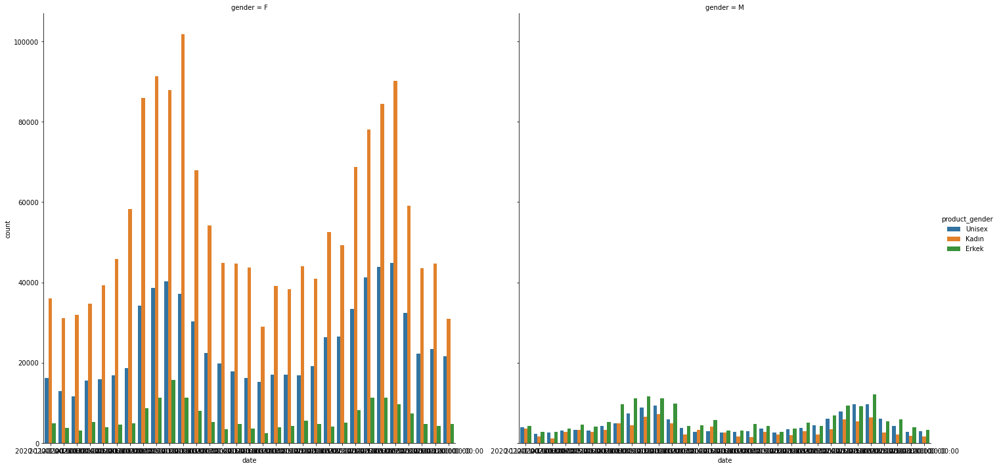

In [90]:
plt.figure(figsize=(25,4))

g = sns.catplot(x="date", hue="product_gender", col="gender",
                data=train, kind="count",
                height=10, aspect=1 ,order = pd.date_range(start="2020-11-01",end="2020-12-01"));

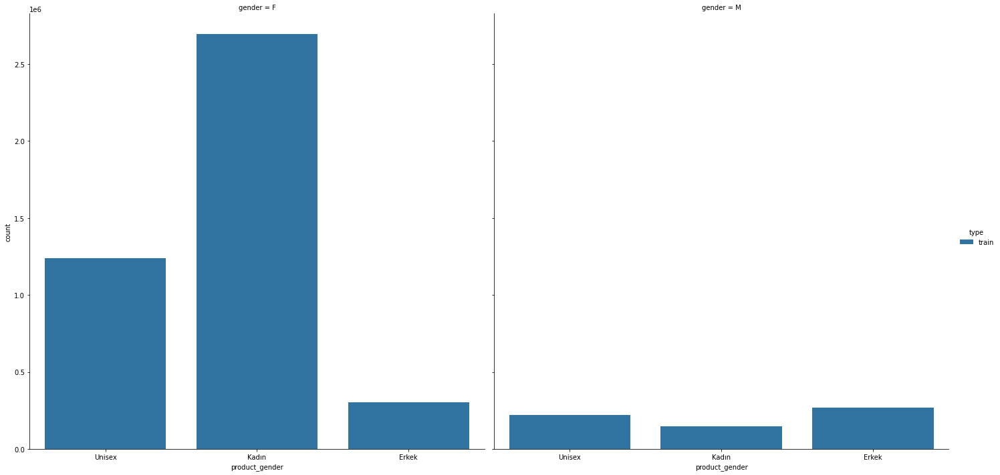

In [92]:
g = sns.catplot(x="product_gender", hue="type", col="gender",
                data=train, kind="count",
                height=10, aspect=1);

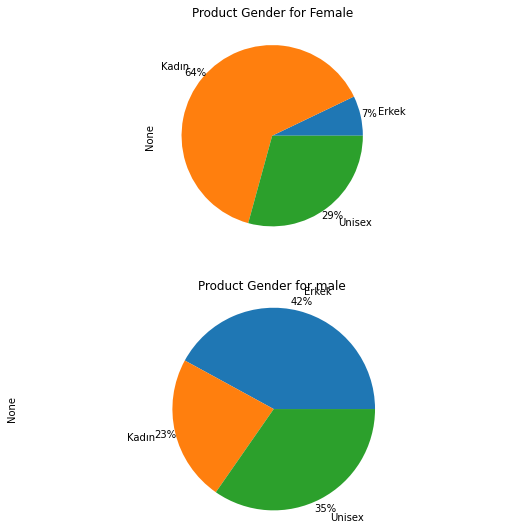

In [118]:
fig, axes = plt.subplots(2, figsize=(8, 8))

axes[0].set_title('Product Gender for Female')
train[train['gender']=='F'].groupby(train.product_gender).size().plot(kind='pie', ax= axes[0], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

axes[1].set_title('Product Gender for male')
train[train['gender']=='M'].groupby(train.product_gender).size().plot(kind='pie', ax= axes[1], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

plt.tight_layout(pad=3);

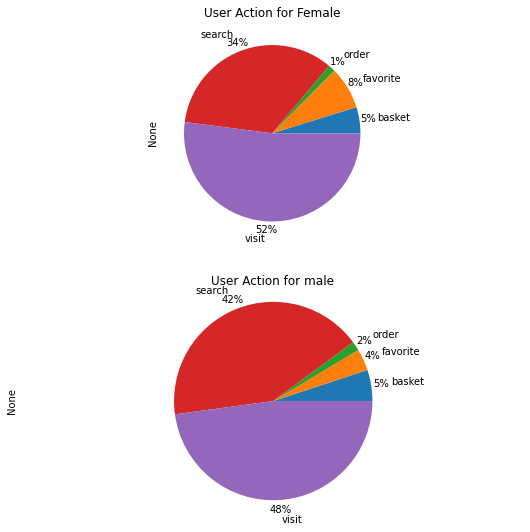

In [120]:
fig, axes = plt.subplots(2, figsize=(8, 8))

axes[0].set_title('User Action for Female')
train[train['gender']=='F'].groupby(train.user_action).size().plot(kind='pie', ax= axes[0], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

axes[1].set_title('User Action for male')
train[train['gender']=='M'].groupby(train.user_action).size().plot(kind='pie', ax= axes[1], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

plt.tight_layout(pad=3);

In [91]:
train.businessunit.unique()

array(['Beyaz Eşya', 'Branded Shoes A', 'Gözlük A', 'İç Giyim', 'Kadın B',
       'PL Woman', 'Sağlık', 'Sofra & Mutfak', 'Branded Shoes B',
       'Salon &Mutfak Mobilya', 'Luxury', 'Çanta & Valiz', 'Cilt Bakım',
       'Kırtasiye & Ofis', 'Ev Dekorasyon', 'Elektrikli Ev Aletleri',
       'Saat A', 'Bahçe & Yapı Market & Hırdavat', 'Ev Gereçleri',
       'Ev Tekstil', 'Yatak Oda Mobilyası', 'Kadın A', 'Banyo', 'Parfüm',
       'TV & Görüntü Ses Sistemleri', 'Cep Telefonu & Aksesuarları',
       'Outdoor Equipment', 'Ev Bakım ve Temizlik', 'Konservatif',
       'Outdoor', 'Büyük Beden', 'Kişisel Bakım', 'Sportswear', 'Mayo',
       'Gözlük B', 'Oto Aksesuar', 'Vücut Bakım', 'Diğer Aksesuarlar',
       'Anne & Bebek Bakım', 'Sport Equipment', 'Erkek B', 'Erkek A',
       'GAS Casual', 'Gıda ve İçecek', 'Makyaj', 'Saat B', 'Takı',
       'Kids & Baby Fashion', 'Designer', 'Lüks & Tasarım', 'Hobi',
       'Books', 'Halı/Kilim', 'Oyuncak', 'Saç Bakım', 'Mücevher',
       'Digital Goods', '

In [8]:
features = ['user_action'
           ,'sellingprice'
           ,'businessunit'
           ,'product_gender'
           ,'month'
           ,'dayOfMonth'
           ,'hour'
           ,'gender']

train_sample = train_sample[features]

In [9]:
from sklearn.ensemble import RandomForestClassifier

# Create a copy to work with
X = train_sample.copy()

# Save and drop labels
y = train_sample.gender
X = X.drop(columns = ['gender'], axis=1)

# fill NANs 
X = X.fillna(-999)

# Label encoder
for c in X.columns[X.dtypes == 'object']:
    X[c] = X[c].factorize()[0]

In [139]:
rf = RandomForestClassifier()
rf.fit(X,y)

RandomForestClassifier()

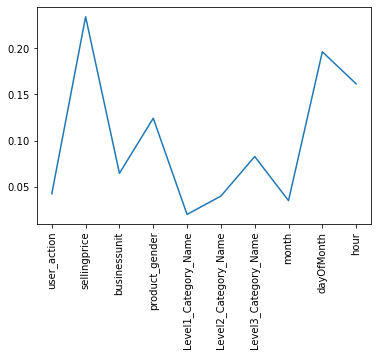

In [140]:
plt.plot(rf.feature_importances_)
plt.xticks(np.arange(X.shape[1]), X.columns.tolist(), rotation=90);

In [143]:
rf.score(X, y, sample_weight=None)

0.997600700493513

In [10]:
X.head(4).T

,3430905,5032004,4165763,571920
user_action,0.00,1.00,1.0,1.0
sellingprice,94.99,55.99,99.0,64.5
businessunit,0.00,0.00,1.0,2.0
product_gender,0.00,0.00,1.0,1.0
month,11.00,11.00,11.0,11.0
dayOfMonth,6.00,11.00,22.0,17.0
hour,23.00,10.00,2.0,9.0


In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [150]:
random_forest = RandomForestClassifier(random_state = 77)

param_grid = {
             'max_depth': np.arange(5,20),
             'min_samples_leaf': np.arange(1,10),
             'n_estimators': np.arange(50, 500)
             }

random_forest_cv = RandomizedSearchCV(random_forest, param_grid, n_iter= 100, scoring='accuracy', cv=10, verbose=1)
random_forest_cv.fit(X, y)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


KeyboardInterrupt: 

In [ ]:
from sklearn.svm import SVC

param_grid = {'C': [0.0001, 0.001, 0.01, 0.1, 1, 5, 10, 100],
             'kernel': ['linear','poly','rbf'],
             'degree': [5,6,7]}
 
grid = GridSearchCV(SVC(), param_grid, scoring='accuracy', cv=10, verbose=1)
 
# fitting the model for grid search
grid_fit = grid.fit(X, y)

Fitting 10 folds for each of 72 candidates, totalling 720 fits


In [ ]:
model1 = LogisticRegressionCV(cv=10, random_state=0,
                              max_iter = 1000).fit(X1, y1)

In [6]:
# user specific feature generation

# userid - user action based statistics

user_vs_action= train.groupby(by=['unique_id', 'user_action'], as_index=False).size()
user_vs_action = user_vs_action.pivot_table('size', ['unique_id'], 'user_action')
user_vs_action.reset_index( drop=False, inplace=True ) 
user_vs_action = user_vs_action[['unique_id', 'favorite', 'order', 'search', 'basket', 'visit']]
user_vs_action = user_vs_action.fillna(0)

user_vs_action['total_transaction'] =  (user_vs_action['favorite'] 
                                        + user_vs_action['order'] 
                                        + user_vs_action['search'] 
                                        + user_vs_action['basket'] 
                                        + user_vs_action['visit'] )

for x in train.user_action.unique().tolist():
    user_vs_action[x + '_percent'] = (
    user_vs_action[x] / user_vs_action['total_transaction']) 
    
for x in train.user_action.unique().tolist():
    for y in train.user_action.unique().tolist():
        if x == y:
            continue
        user_vs_action[x + '_over_' + y] = (
        user_vs_action[x] / user_vs_action[y]) 

for x in train.user_action.unique().tolist():
    for y in train.user_action.unique().tolist():
        if x == y:
            continue
        user_vs_action[x + '_perc_times_' + y + '_perc'] = (
        user_vs_action[x + '_percent'] * user_vs_action[y + '_percent']) 


In [7]:
user_vs_gender= train.groupby(by=['unique_id', 'gender'], as_index=False).size().drop(columns=['size'])
user_vs_action = pd.merge(user_vs_action, user_vs_gender, on = 'unique_id')

user_vs_action.replace([np.inf, -np.inf], np.nan, inplace=True)
X = user_vs_action.drop(columns = ['gender']).fillna(0)
y = user_vs_action.gender

In [195]:
# logistic regression 

from sklearn.linear_model import LogisticRegressionCV
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X)
X_scaled = scaler.transform(X)

model1 = LogisticRegressionCV(cv=10, random_state=0,
                              max_iter = 3000).fit(X_scaled, y)

model1.score(X_scaled,y) # 0.663937

0.6723033107867569

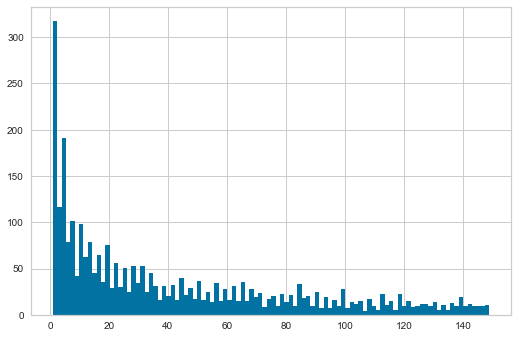

In [178]:
ax = plt.hist(x="total_transaction", data=user_vs_action[user_vs_action['total_transaction']<150], bins = 100, color = 'b')

plt.tight_layout(pad=3);

In [8]:
user_vs_action_pgender= train.groupby(by=['unique_id', 'user_action', 'product_gender'], as_index=False, dropna= False).size()

user_vs_action_pgender = user_vs_action_pgender.fillna('NotDefined')
user_vs_action_pgender = user_vs_action_pgender.pivot_table('size', ['unique_id'], ['user_action', 'product_gender'])

list = []
for x in user_vs_action_pgender.columns:
    list.append(x[0] + '_'+ x[1])
user_vs_action_pgender.columns = list

user_vs_action_pgender.reset_index( drop=False, inplace=True ) 

user_vs_action_pgender = user_vs_action_pgender.fillna(0)



user_features = pd.merge(user_vs_action, user_vs_action_pgender, on = 'unique_id')

for x in user_vs_action_pgender.columns:
    if x == 'unique_id':
        continue
    user_features[x + '_percent'] = (
    user_features[x] / user_features[x.split('_')[0]])

for x in user_vs_action_pgender.columns:
    if x == 'unique_id':
        continue
    for y in user_vs_action_pgender.columns:
        if y == 'unique_id':
            continue
        if x == y:
            continue
        user_features[x + '_over_' + y] = (
        user_features[x] / user_features[y]) 

for x in user_vs_action_pgender.columns:
    if x == 'unique_id':
        continue
    for y in user_vs_action_pgender.columns:
        if y == 'unique_id':
            continue
        if x == y:
            continue
        user_features[x + '_perc_times_' + y + '_perc'] = (
        user_features[x + '_percent'] * user_features[y + '_percent']) 

user_features.replace([np.inf, -np.inf], np.nan, inplace=True)
X = user_features.drop(columns = ['gender']).fillna(0)
y = user_features.gender

In [14]:
# logistic regression 

from sklearn.linear_model import LogisticRegressionCV
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X)
X_scaled = scaler.transform(X)

model1 = LogisticRegressionCV(cv=10, random_state=0,
                              max_iter = 3000).fit(X_scaled, y)

model1.score(X_scaled,y) # 0.7983

0.7993948024207903

In [26]:
from sklearn.decomposition import PCA
pca = PCA()
Xt = pca.fit_transform(X_scaled)


In [25]:
pca.explained_variance_ratio_.reshape(852,1).cumsum()

array([0.07570738, 0.13131086, 0.17940537, 0.20319824, 0.22390448,
       0.24441229, 0.26129579, 0.27765459, 0.29344099, 0.30860345,
       0.32334988, 0.33695636, 0.34974458, 0.3622137 , 0.37370532,
       0.38457572, 0.39477399, 0.40475181, 0.41435249, 0.42359927,
       0.43257409, 0.44115778, 0.44952574, 0.45777845, 0.46576068,
       0.47345407, 0.48097637, 0.48839897, 0.49557162, 0.50271361,
       0.50953491, 0.51598401, 0.52229467, 0.52849772, 0.5346031 ,
       0.54050175, 0.54632795, 0.55196417, 0.55749892, 0.56294707,
       0.56827944, 0.57356867, 0.57863747, 0.5836396 , 0.58847755,
       0.59326386, 0.5979297 , 0.60250192, 0.60703493, 0.6114066 ,
       0.61572714, 0.61996073, 0.62412714, 0.62826222, 0.63229455,
       0.63628427, 0.64021277, 0.64399518, 0.64769117, 0.65137186,
       0.6549849 , 0.65853473, 0.66203957, 0.66548104, 0.66881941,
       0.67211794, 0.67534144, 0.67850795, 0.68163039, 0.68471084,
       0.68775591, 0.69075801, 0.69370114, 0.69653043, 0.69932

In [20]:
print(pca.explained_variance_ratio_)

[7.57073799e-02 5.56034761e-02 4.80945124e-02 2.37928765e-02
 2.07062396e-02 2.05078032e-02 1.68835015e-02 1.63587982e-02
 1.57864027e-02 1.51624624e-02 1.47464263e-02 1.36064779e-02
 1.27882211e-02 1.24691267e-02 1.14916205e-02 1.08703998e-02
 1.01982610e-02 9.97782668e-03 9.60067492e-03 9.24678096e-03
 8.97482363e-03 8.58369147e-03 8.36795443e-03 8.25270921e-03
 7.98223370e-03 7.69339083e-03 7.52229772e-03 7.42260168e-03
 7.17265371e-03 7.14198304e-03 6.82129913e-03 6.44909912e-03
 6.31066820e-03 6.20304573e-03 6.10537574e-03 5.89865593e-03
 5.82619801e-03 5.63621612e-03 5.53475611e-03 5.44815017e-03
 5.33237180e-03 5.28922606e-03 5.06879926e-03 5.00212628e-03
 4.83795606e-03 4.78630687e-03 4.66584667e-03 4.57221329e-03
 4.53301120e-03 4.37166834e-03 4.32053724e-03 4.23359077e-03
 4.16641154e-03 4.13508047e-03 4.03233013e-03 3.98972620e-03
 3.92849859e-03 3.78241027e-03 3.69598294e-03 3.68069564e-03
 3.61304027e-03 3.54982863e-03 3.50483783e-03 3.44147251e-03
 3.33836451e-03 3.298532

In [17]:

pd_y = pd.DataFrame(y)
pd_y['label'] = (pd_y['gender'] == 'F')
pd_y['label'] = (pd_y['label']).astype(int)



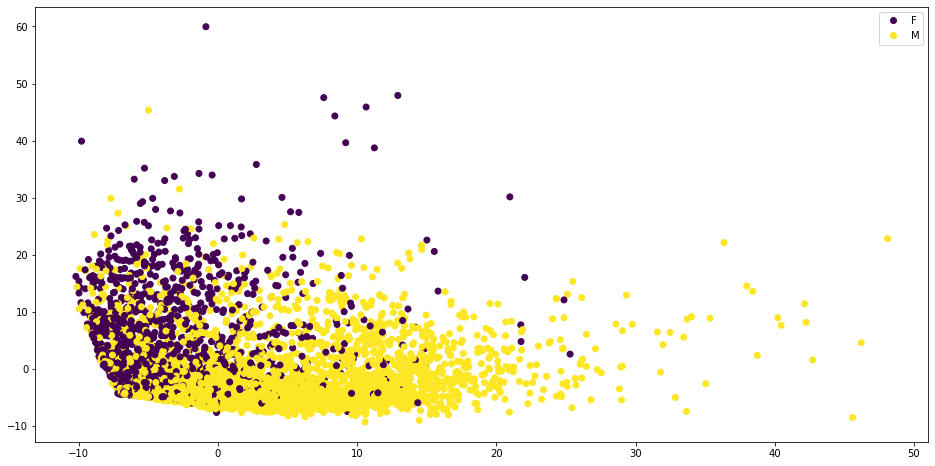

In [48]:
plt.figure(figsize=(16,8))

plot = plt.scatter(Xt[:,0], Xt[:,1], c=pd_y['label'])
plt.legend(handles=plot.legend_elements()[0], labels=['F', 'M'])
plt.show()

In [12]:
roes

In [18]:
pd_x_scaled = pd.DataFrame(X_scaled)
pd_x_scaled.columns = X.columns
pd_x_scaled

,unique_id,favorite,order,search,basket,visit,total_transaction,favorite_percent,visit_percent,search_percent,basket_percent,order_percent,favorite_over_visit,favorite_over_search,favorite_over_basket,favorite_over_order,visit_over_favorite,visit_over_search,visit_over_basket,visit_over_order,search_over_favorite,search_over_visit,search_over_basket,search_over_order,basket_over_favorite,basket_over_visit,basket_over_search,basket_over_order,order_over_favorite,order_over_visit,order_over_search,order_over_basket,favorite_perc_times_visit_perc,favorite_perc_times_search_perc,favorite_perc_times_basket_perc,favorite_perc_times_order_perc,visit_perc_times_favorite_perc,visit_perc_times_search_perc,visit_perc_times_basket_perc,visit_perc_times_order_perc,search_perc_times_favorite_perc,search_perc_times_visit_perc,search_perc_times_basket_perc,search_perc_times_order_perc,basket_perc_times_favorite_perc,basket_perc_times_visit_perc,basket_perc_times_search_perc,basket_perc_times_order_perc,order_perc_times_favorite_perc,order_perc_times_visit_perc,order_perc_times_search_perc,order_perc_times_basket_perc,basket_Erkek,basket_Kadın,basket_NotDefined,basket_Unisex,favorite_Erkek,favorite_Kadın,favorite_NotDefined,favorite_Unisex,order_Erkek,order_Kadın,order_NotDefined,order_Unisex,search_Erkek,search_Kadın,search_NotDefined,search_Unisex,visit_Erkek,visit_Kadın,visit_NotDefined,visit_Unisex,basket_Erkek_percent,basket_Kadın_percent,basket_NotDefined_percent,basket_Unisex_percent,favorite_Erkek_percent,favorite_Kadın_percent,favorite_NotDefined_percent,favorite_Unisex_percent,order_Erkek_percent,order_Kadın_percent,order_NotDefined_percent,order_Unisex_percent,search_Erkek_percent,search_Kadın_percent,search_NotDefined_percent,search_Unisex_percent,visit_Erkek_percent,visit_Kadın_percent,visit_NotDefined_percent,visit_Unisex_percent,basket_Erkek_over_basket_Kadın,basket_Erkek_over_basket_NotDefined,basket_Erkek_over_basket_Unisex,basket_Erkek_over_favorite_Erkek,basket_Erkek_over_favorite_Kadın,basket_Erkek_over_favorite_NotDefined,basket_Erkek_over_favorite_Unisex,basket_Erkek_over_order_Erkek,basket_Erkek_over_order_Kadın,basket_Erkek_over_order_NotDefined,basket_Erkek_over_order_Unisex,basket_Erkek_over_search_Erkek,basket_Erkek_over_search_Kadın,basket_Erkek_over_search_NotDefined,basket_Erkek_over_search_Unisex,basket_Erkek_over_visit_Erkek,basket_Erkek_over_visit_Kadın,basket_Erkek_over_visit_NotDefined,basket_Erkek_over_visit_Unisex,basket_Kadın_over_basket_Erkek,basket_Kadın_over_basket_NotDefined,basket_Kadın_over_basket_Unisex,basket_Kadın_over_favorite_Erkek,basket_Kadın_over_favorite_Kadın,basket_Kadın_over_favorite_NotDefined,basket_Kadın_over_favorite_Unisex,basket_Kadın_over_order_Erkek,basket_Kadın_over_order_Kadın,basket_Kadın_over_order_NotDefined,basket_Kadın_over_order_Unisex,basket_Kadın_over_search_Erkek,basket_Kadın_over_search_Kadın,basket_Kadın_over_search_NotDefined,basket_Kadın_over_search_Unisex,basket_Kadın_over_visit_Erkek,basket_Kadın_over_visit_Kadın,basket_Kadın_over_visit_NotDefined,basket_Kadın_over_visit_Unisex,basket_NotDefined_over_basket_Erkek,basket_NotDefined_over_basket_Kadın,basket_NotDefined_over_basket_Unisex,basket_NotDefined_over_favorite_Erkek,basket_NotDefined_over_favorite_Kadın,basket_NotDefined_over_favorite_NotDefined,basket_NotDefined_over_favorite_Unisex,basket_NotDefined_over_order_Erkek,basket_NotDefined_over_order_Kadın,basket_NotDefined_over_order_NotDefined,basket_NotDefined_over_order_Unisex,basket_NotDefined_over_search_Erkek,basket_NotDefined_over_search_Kadın,basket_NotDefined_over_search_NotDefined,basket_NotDefined_over_search_Unisex,basket_NotDefined_over_visit_Erkek,basket_NotDefined_over_visit_Kadın,basket_NotDefined_over_visit_NotDefined,basket_NotDefined_over_visit_Unisex,basket_Unisex_over_basket_Erkek,basket_Unisex_over_basket_Kadın,basket_Unisex_over_basket_NotDefined,basket_Unisex_over_favorite_Erkek,basket_Unisex_over_favorite_Kadın,basket_Unisex_over_favori

In [19]:
data = pd.concat([pd_x_scaled, pd_y['label']],axis = 1)

In [20]:
clf = setup(data, target='label', fold_shuffle=True)

,Description,Value
0,session_id,3408
1,Target,label
2,Original Data,"(5618, 853)"
3,Missing Values,False
4,Numeric Features,852
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(3932, 652)"


AttributeError: 'Simple_Imputer' object has no attribute 'fill_value_categorical'

In [101]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.2856,0.1418,0.3763,0.3753,0.2643,0.2215,2.1650
catboost,CatBoost Regressor,0.2825,0.1450,0.3807,0.3610,0.2665,0.2229,29.4790
br,Bayesian Ridge,0.3086,0.1465,0.3825,0.3547,0.2687,0.2465,0.2540
lightgbm,Light Gradient Boosting Machine,0.2786,0.1488,0.3856,0.3444,0.2697,0.2184,1.5400
rf,Random Forest Regressor,0.2854,0.1524,0.3903,0.3280,0.2730,0.2211,6.1250
omp,Orthogonal Matching Pursuit,0.3052,0.1557,0.3940,0.3148,0.2727,0.2455,0.0300
ada,AdaBoost Regressor,0.3502,0.1613,0.4015,0.2887,0.2820,0.2836,0.9440
et,Extra Trees Regressor,0.2878,0.1644,0.4053,0.2752,0.2834,0.2232,4.0490
knn,K Neighbors Regressor,0.2924,0.1750,0.4182,0.2278,0.2934,0.2073,0.0430
huber,Huber Regressor,0.3073,0.1994,0.4449,0.1234,0.2929,0.2467,0.9040


GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, random_state=2604,
                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
                          verbose=0, warm_start=False)

In [21]:
model = create_model('gbr')


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.3089,0.1528,0.3909,0.3484,0.2767,0.2358
1,0.2930,0.1401,0.3744,0.3686,0.2610,0.2368
2,0.2955,0.1535,0.3918,0.3444,0.2785,0.2107
3,0.3012,0.1521,0.3900,0.3301,0.2741,0.2269
4,0.2893,0.1389,0.3727,0.3944,0.2615,0.2290
5,0.3129,0.1617,0.4021,0.2777,0.2798,0.2585
6,0.2839,0.1367,0.3697,0.3848,0.2573,0.2283
7,0.2679,0.1280,0.3578,0.4172,0.2527,0.1942
8,0.2899,0.1497,0.3869,0.3430,0.2745,0.2019
9,0.2873,0.1399,0.3741,0.3817,0.2609,0.2328


In [34]:
tuned_gbr = tune_model(model)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.3206,0.1582,0.3977,0.3255,0.2828,0.2415
1,0.3093,0.1513,0.3890,0.3183,0.2702,0.2535
2,0.3117,0.1606,0.4007,0.3141,0.2857,0.2248
3,0.3036,0.1504,0.3878,0.3379,0.2715,0.2413
4,0.3016,0.1455,0.3814,0.3657,0.2677,0.2429
5,0.3216,0.1635,0.4043,0.2698,0.2787,0.2737
6,0.2981,0.1457,0.3817,0.3444,0.2647,0.2495
7,0.2810,0.1331,0.3648,0.3940,0.2581,0.2043
8,0.3030,0.1566,0.3958,0.3126,0.2794,0.2197
9,0.2966,0.1423,0.3772,0.3713,0.2639,0.2388


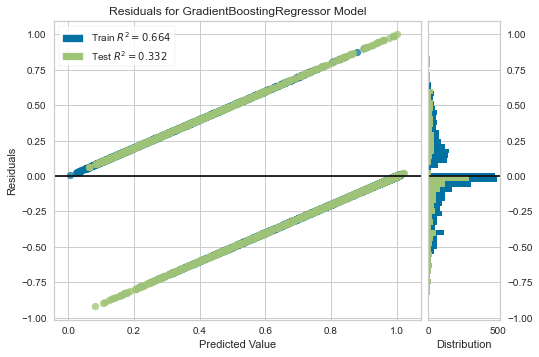

In [106]:
plot_model(tuned_gbr)

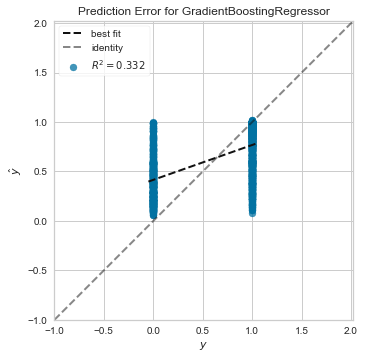

In [107]:
plot_model(tuned_gbr, plot = 'error')

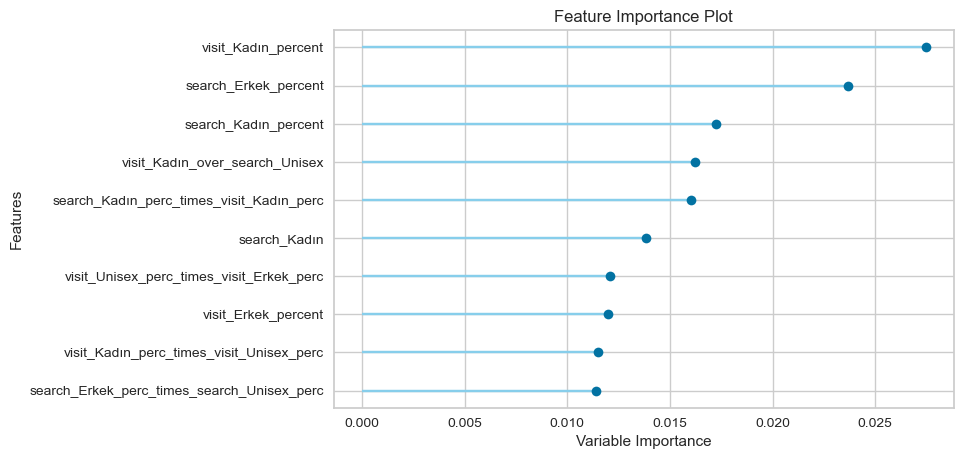

In [108]:
plot_model(tuned_gbr, plot = 'feature')

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

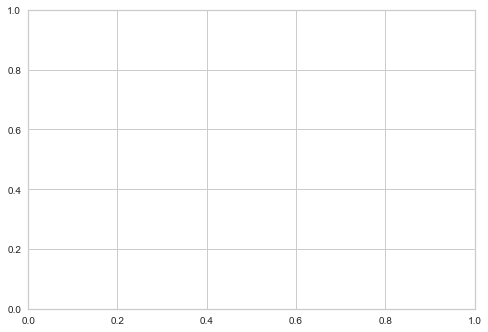

In [109]:
evaluate_model(tuned_gbr)


In [115]:
predictions = predict_model(tuned_gbr)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Gradient Boosting Regressor,0.2928,0.1478,0.3845,0.3318,0.2669,0.2324


user_action,unique_id,favorite,order,search,basket,visit,total_transaction,favorite_percent,visit_percent,search_percent,...,search_perc_times_basket_perc,search_perc_times_order_perc,basket_perc_times_favorite_perc,basket_perc_times_visit_perc,basket_perc_times_search_perc,basket_perc_times_order_perc,order_perc_times_favorite_perc,order_perc_times_visit_perc,order_perc_times_search_perc,order_perc_times_basket_perc
0,9,92.0,22.0,1674.0,122.0,1392.0,3302.0,0.027862,0.421563,0.506965,...,0.018731,0.003378,0.001029,0.015576,0.018731,0.000246,0.000186,0.002809,0.003378,0.000246
1,18,2996.0,1141.0,20321.0,2611.0,44261.0,71330.0,0.042002,0.620510,0.284887,...,0.010428,0.004557,0.001537,0.022713,0.010428,0.000586,0.000672,0.009926,0.004557,0.000586
2,21,1088.0,32.0,2744.0,100.0,4700.0,8664.0,0.125577,0.542475,0.316713,...,0.003656,0.001170,0.001449,0.006261,0.003656,0.000043,0.000464,0.002004,0.001170,0.000043
3,25,948.0,72.0,4068.0,180.0,7812.0,13080.0,0.072477,0.597248,0.311009,...,0.004280,0.001712,0.000997,0.008219,0.004280,0.000076,0.000399,0.003288,0.001712,0.000076
4,31,2043.0,171.0,20583.0,2817.0,48672.0,74286.0,0.027502,0.655197,0.277078,...,0.010507,0.000638,0.001043,0.024846,0.010507,0.000087,0.000063,0.001508,0.000638,0.000087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2375,7982,0.0,0.0,1.0,0.0,0.0,1.0,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2376,7990,0.0,0.0,0.0,0.0,1.0,1.0,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2377,7993,0.0,0.0,0.0,0.0,1.0,1.0,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2378,7994,0.0,1.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
# test set generation 

user_vs_action= test.groupby(by=['unique_id', 'user_action'], as_index=False).size()
user_vs_action = user_vs_action.pivot_table('size', ['unique_id'], 'user_action')
user_vs_action.reset_index( drop=False, inplace=True ) 
user_vs_action = user_vs_action[['unique_id', 'favorite', 'order', 'search', 'basket', 'visit']]
user_vs_action = user_vs_action.fillna(0)

user_vs_action['total_transaction'] =  (user_vs_action['favorite'] 
                                        + user_vs_action['order'] 
                                        + user_vs_action['search'] 
                                        + user_vs_action['basket'] 
                                        + user_vs_action['visit'] )

for x in train.user_action.unique().tolist():
    user_vs_action[x + '_percent'] = (
    user_vs_action[x] / user_vs_action['total_transaction']) 
    
for x in train.user_action.unique().tolist():
    for y in train.user_action.unique().tolist():
        if x == y:
            continue
        user_vs_action[x + '_over_' + y] = (
        user_vs_action[x] / user_vs_action[y]) 

for x in train.user_action.unique().tolist():
    for y in train.user_action.unique().tolist():
        if x == y:
            continue
        user_vs_action[x + '_perc_times_' + y + '_perc'] = (
        user_vs_action[x + '_percent'] * user_vs_action[y + '_percent']) 
        


user_vs_action.replace([np.inf, -np.inf], np.nan, inplace=True)
X = user_vs_action.fillna(0)

user_vs_action_pgender= test.groupby(by=['unique_id', 'user_action', 'product_gender'], as_index=False, dropna= False).size()

user_vs_action_pgender = user_vs_action_pgender.fillna('NotDefined')
user_vs_action_pgender = user_vs_action_pgender.pivot_table('size', ['unique_id'], ['user_action', 'product_gender'])

list = []
for x in user_vs_action_pgender.columns:
    list.append(x[0] + '_'+ x[1])
user_vs_action_pgender.columns = list

user_vs_action_pgender.reset_index( drop=False, inplace=True ) 

user_vs_action_pgender = user_vs_action_pgender.fillna(0)



user_features = pd.merge(user_vs_action, user_vs_action_pgender, on = 'unique_id')

for x in user_vs_action_pgender.columns:
    if x == 'unique_id':
        continue
    user_features[x + '_percent'] = (
    user_features[x] / user_features[x.split('_')[0]])

for x in user_vs_action_pgender.columns:
    if x == 'unique_id':
        continue
    for y in user_vs_action_pgender.columns:
        if y == 'unique_id':
            continue
        if x == y:
            continue
        user_features[x + '_over_' + y] = (
        user_features[x] / user_features[y]) 

for x in user_vs_action_pgender.columns:
    if x == 'unique_id':
        continue
    for y in user_vs_action_pgender.columns:
        if y == 'unique_id':
            continue
        if x == y:
            continue
        user_features[x + '_perc_times_' + y + '_perc'] = (
        user_features[x + '_percent'] * user_features[y + '_percent']) 

user_features.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test = user_features.fillna(0)

In [35]:
X_test = scaler.transform(X)
pd_x_test_scaled = pd.DataFrame(X_test)
pd_x_test_scaled.columns = X.columns
pd_x_test_scaled

,unique_id,favorite,order,search,basket,visit,total_transaction,favorite_percent,visit_percent,search_percent,...,visit_Unisex_perc_times_order_Kadın_perc,visit_Unisex_perc_times_order_NotDefined_perc,visit_Unisex_perc_times_order_Unisex_perc,visit_Unisex_perc_times_search_Erkek_perc,visit_Unisex_perc_times_search_Kadın_perc,visit_Unisex_perc_times_search_NotDefined_perc,visit_Unisex_perc_times_search_Unisex_perc,visit_Unisex_perc_times_visit_Erkek_perc,visit_Unisex_perc_times_visit_Kadın_perc,visit_Unisex_perc_times_visit_NotDefined_perc
0,-1.742594,0.718951,1.801352,5.537829,2.736005,2.756309,3.759765,-0.265669,-0.090905,0.505018,...,0.005665,-0.327197,-0.466765,-0.454364,-0.338425,-0.531440,-0.668751,-0.527672,-0.375880,-0.682234
1,-1.738695,33.241858,114.822569,72.736841,67.990151,100.477705,90.986598,-0.175282,0.753711,-0.466645,...,0.539438,-0.215051,-0.296271,-0.364838,0.362932,-0.473108,-0.612210,-0.411934,0.551788,-0.594031
2,-1.737396,11.873502,2.811372,9.393835,2.159231,10.297011,10.635027,0.358949,0.422417,-0.327398,...,0.847485,-0.366883,-0.395350,-0.337066,-0.074023,-0.485527,-0.529711,-0.448209,0.381385,-0.653916
3,-1.735664,10.305593,6.851451,14.165192,4.256592,17.390925,16.297308,0.019521,0.654952,-0.352353,...,0.026829,0.007645,0.248191,-0.347608,0.547873,-0.303729,-0.443758,-0.429230,1.115830,-0.445663
4,-1.733065,22.568879,16.850647,73.681022,73.390856,110.532735,94.776840,-0.267971,0.900973,-0.500814,...,1.236028,0.218597,0.278337,-0.394125,0.825765,0.129474,-0.131974,-0.506578,1.509292,0.139415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2375,1.710750,-0.311389,-0.420692,-0.491234,-0.462470,-0.416804,-0.472841,-0.443769,-1.880614,2.662200,...,-0.429890,-0.366883,-0.466765,-0.478150,-0.670794,-0.548456,-0.688463,-0.566615,-0.865457,-0.710046
2376,1.714215,-0.311389,-0.420692,-0.494838,-0.462470,-0.414525,-0.472841,-0.443769,2.364803,-1.713117,...,-0.429890,-0.366883,-0.466765,-0.478150,-0.670794,-0.548456,-0.688463,-0.566615,-0.865457,-0.710046
2377,1.715514,-0.311389,-0.420692,-0.494838,-0.462470,-0.414525,-0.472841,-0.443769,2.364803,-1.713117,...,-0.429890,-0.366883,-0.466765,-0.478150,-0.670794,-0.548456,-0.688463,-0.566615,-0.865457,-0.710046
2378,1.715947,-0.311389,-0.319690,-0.494838,-0.462470,-0.416804,-0.472841,-0.443769,-1.880614,-1.713117,...,-0.429890,-0.366883,-0.466765,-0.478150,-0.670794,-0.548456,-0.688463,-0.566615,-0.865457,-0.710046


,unique_id,Label
0,9,0.997439
1,18,0.891450
2,21,0.941691
3,25,0.906425
4,31,0.889785
...,...,...
2375,7982,0.704785
2376,7990,0.588601
2377,7993,0.599433
2378,7994,0.690922


In [ ]:
predictions = predict_model(tuned_gbr, data = pd_x_test_scaled)

In [42]:
preds = pd.concat([X[['unique_id']], predictions[['Label']]], axis = 1)

In [44]:
results = pd.merge(test_ids, preds, on = 'unique_id', how= 'left')

In [49]:
converted_list = [str(element) for element in results.Label.tolist()]

In [50]:
",".join(converted_list)

'0.9974392582726574,0.8914496179487674,0.9416908964131101,0.9064252512636679,0.8897852283866826,0.9301358091338485,0.7438226071034404,0.34653586827081784,0.9296649695770598,0.9028506479679068,0.1265462427682191,0.3296007675749494,0.9516513710925882,1.0075387440964136,0.8964329495341432,0.8586539711764901,0.4784322378647677,0.35213985252358027,1.054502207607918,1.022485309780066,0.9811383705775373,0.9900501394419678,0.866072762541968,0.9649134707770781,0.999538655835539,0.9399950014492057,0.9932750028089151,1.0130069087982423,0.8993430022043376,1.0991521315883743,1.0103588488317874,0.8676520521656789,0.90288758503194,0.8720691591093677,0.9657784376722919,0.9049321814606712,0.6291131855007107,0.9790353096425387,0.9626790134489206,0.9131102558829306,0.8423717853930233,0.9471256673069406,1.0547839591111712,0.40346201243505236,1.0313661276953492,0.8608344391516244,0.8521225562057815,0.6233645131183337,0.9670436621954959,0.6224384819711933,0.18078836284962171,0.9936504754809394,0.68097355579

In [ ]:
a_list = ["a", "b", "c"]
joined_string = ",".join(a_list)

In [388]:
marker = 0
for i in range(0, len(X_scaled)):
    if round(X_scaled[i][0],6) == 0.032805:
        marker = i

X.iloc[marker,0]      

2841


In [397]:
pd.reset_option('display.max_columns')
pd.reset_option('display.max_rows')

predictions[predictions['is_true_predicted']==0]

,unique_id,favorite,order,search,basket,visit,total_transaction,favorite_percent,visit_percent,search_percent,...,visit_Unisex_perc_times_favorite_Erkek_perc,visit_Unisex_perc_times_favorite_Unisex_perc,visit_Unisex_perc_times_order_NotDefined_perc,visit_Unisex_perc_times_order_Unisex_perc,visit_Unisex_perc_times_search_Erkek_perc,visit_Unisex_perc_times_visit_Erkek_perc,visit_Unisex_perc_times_visit_NotDefined_perc,label,Label,is_true_predicted
1,1.456936,-0.208238,-0.224820,-0.288843,-0.247854,-0.215804,-0.253015,-0.442712,1.205675,-1.315409,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,2.230629,-0.709853,1,0.449955,False
12,-0.435408,-0.208238,-0.224820,-0.290532,-0.270794,-0.212261,-0.252485,-0.442712,2.362849,-1.712936,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,-0.566255,-0.709853,1,0.420803,False
23,-0.368273,-0.208238,-0.224820,-0.224660,-0.184770,-0.190117,-0.214631,-0.442712,-0.000004,0.329448,...,-0.276772,-0.455006,-0.366570,-0.466395,1.016615,2.166479,-0.395027,1,0.327214,False
26,1.618060,-0.208238,-0.224820,-0.290532,-0.270794,-0.221562,-0.258044,-0.442712,2.362849,-1.712936,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,-0.566255,-0.709853,0,0.602863,False
31,1.688227,-0.208238,-0.224820,-0.290532,-0.270794,-0.222447,-0.258574,-0.442712,2.362849,-1.712936,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,-0.566255,-0.709853,0,0.601152,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1659,-0.047757,-0.208238,-0.224820,-0.228038,-0.259324,-0.210047,-0.231043,-0.442712,-0.708256,1.368844,...,-0.276772,-0.455006,-0.366570,-0.466395,0.824077,0.072272,-0.709853,0,0.589039,False
1662,0.491056,-0.178738,-0.189389,-0.204392,-0.161831,-0.158672,-0.185247,-0.212653,0.332937,-0.108529,...,1.791306,-0.335267,0.682156,0.033652,0.436064,1.410627,-0.224344,1,0.124623,False
1667,0.098208,-0.205288,-0.224820,-0.267730,-0.270794,-0.190560,-0.232102,-0.379389,1.186579,-0.543971,...,-0.276772,-0.455006,-0.366570,-0.466395,0.183786,-0.284100,-0.511206,0,0.705583,False
1672,1.006914,-0.208238,-0.224820,-0.269419,-0.253589,-0.220233,-0.249838,-0.442712,-1.131364,1.502355,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,-0.566255,-0.709853,1,0.302009,False


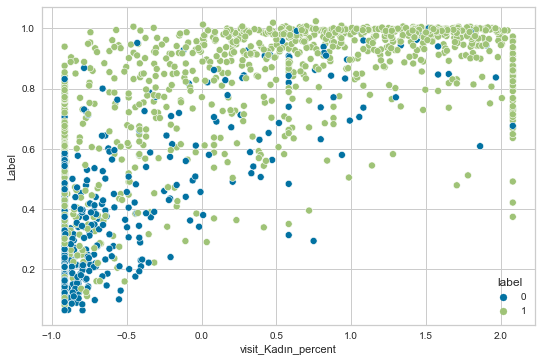

In [118]:
ax = sns.scatterplot(x="visit_Kadın_percent", y= "Label", data=predictions, hue = 'label')
plt.tight_layout(pad=2);

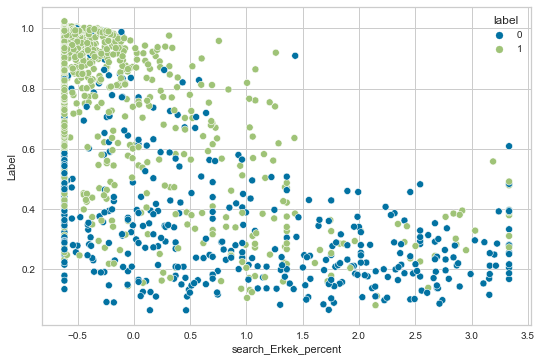

In [119]:
ax = sns.scatterplot(x="search_Erkek_percent", y= "Label", data=predictions, hue = 'label')
plt.tight_layout(pad=2);

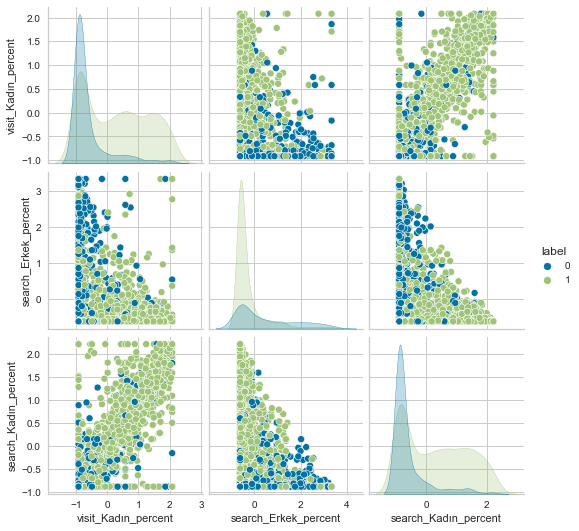

In [123]:
sns.pairplot(predictions[['visit_Kadın_percent', 'search_Erkek_percent', 'search_Kadın_percent', 'label']], hue='label');

In [ ]:
predictions['is_true_predicted'] = predictions['label'] == ((predictions['Label']> 0.5))

In [323]:
predictions[predictions['total_transaction']< -0.2]

,unique_id,favorite,order,search,basket,visit,total_transaction,favorite_percent,visit_percent,search_percent,...,visit_Unisex_perc_times_favorite_Erkek_perc,visit_Unisex_perc_times_favorite_Unisex_perc,visit_Unisex_perc_times_order_NotDefined_perc,visit_Unisex_perc_times_order_Unisex_perc,visit_Unisex_perc_times_search_Erkek_perc,visit_Unisex_perc_times_visit_Erkek_perc,visit_Unisex_perc_times_visit_NotDefined_perc,label,Label,is_true_predicted
0,1.075348,-0.208238,-0.207105,-0.281242,-0.270794,-0.222890,-0.255662,-0.442712,-1.880124,2.295460,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,-0.566255,-0.709853,1,0.552583,True
1,1.456936,-0.208238,-0.224820,-0.288843,-0.247854,-0.215804,-0.253015,-0.442712,1.205675,-1.315409,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,2.230629,-0.709853,1,0.449955,False
2,-0.502976,-0.208238,-0.207105,-0.265196,-0.247854,-0.200746,-0.236337,-0.442712,0.615742,-0.169596,...,-0.276772,-0.455006,0.534558,-0.466395,-0.477593,-0.566255,-0.709853,1,0.941868,True
3,1.563052,-0.208238,-0.207105,-0.289687,-0.270794,-0.220233,-0.256721,-0.442712,1.302106,-1.166336,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,-0.566255,-0.709853,1,0.587690,True
4,1.387635,-0.208238,-0.118528,-0.282931,-0.270794,-0.222890,-0.254868,-0.442712,-1.880124,0.910741,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,-0.566255,-0.709853,1,0.507667,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678,0.245905,-0.208238,-0.224820,-0.275331,-0.253589,-0.218904,-0.250897,-0.442712,-0.607232,0.910741,...,-0.276772,-0.455006,-0.366570,-0.466395,1.246718,0.759675,-0.709853,1,0.772181,True
1679,1.018608,-0.208238,-0.207105,-0.285465,-0.265059,-0.220676,-0.255397,-0.442712,-0.248212,0.305277,...,-0.276772,-0.455006,-0.366570,1.681952,-0.477593,3.729759,-0.709853,0,0.162986,True
1681,1.609397,-0.208238,-0.224820,-0.288843,-0.270794,-0.222890,-0.258309,-0.442712,-1.880124,2.659859,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,-0.566255,-0.709853,1,0.675937,True
1682,1.200523,-0.208238,-0.224820,-0.289687,-0.265059,-0.216690,-0.254603,-0.442712,1.832477,-1.439636,...,-0.276772,-0.455006,-0.366570,-0.466395,-0.477593,-0.566255,-0.709853,0,0.465934,True


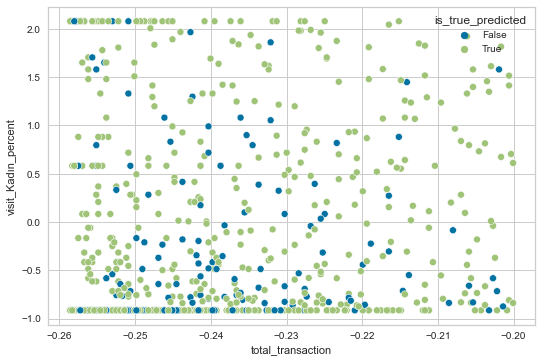

In [134]:
ax = sns.scatterplot(x="total_transaction", y= "visit_Kadın_percent", data=predictions[predictions['total_transaction']< -0.2], hue = 'is_true_predicted')
plt.tight_layout(pad=2);

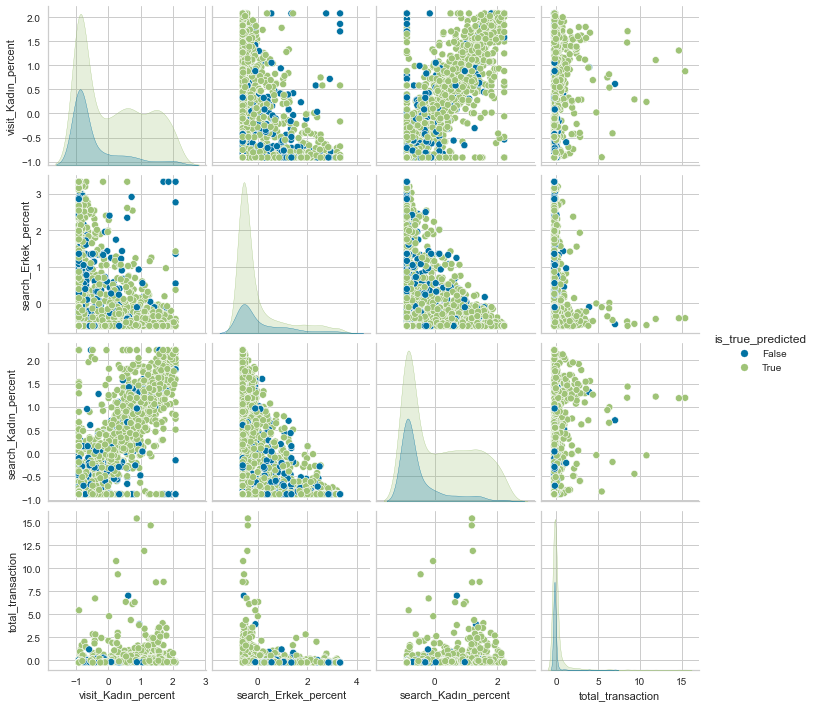

In [151]:
sns.pairplot(predictions[['visit_Kadın_percent', 'search_Erkek_percent', 'search_Kadın_percent','total_transaction', 'is_true_predicted']], hue='is_true_predicted');

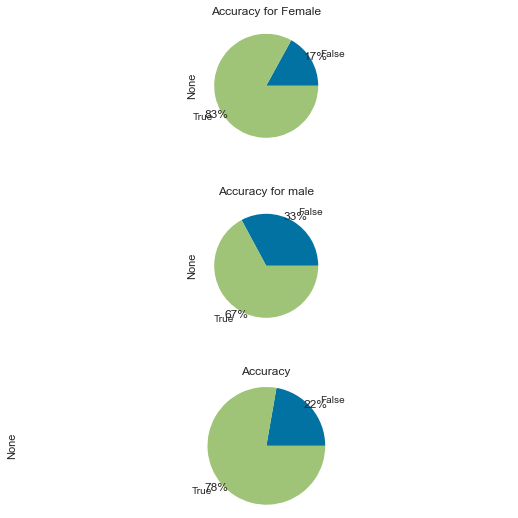

In [138]:
fig, axes = plt.subplots(3, figsize=(8, 8))

axes[0].set_title('Accuracy for Female')
predictions[predictions['label']==1].groupby(predictions.is_true_predicted).size().plot(kind='pie', ax= axes[0], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

axes[1].set_title('Accuracy for male')
predictions[predictions['label']==0].groupby(predictions.is_true_predicted).size().plot(kind='pie', ax= axes[1], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

axes[2].set_title('Accuracy')
predictions.groupby(predictions.is_true_predicted).size().plot(kind='pie', ax= axes[2], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

plt.tight_layout(pad=3);

In [181]:
predictions['total_transaction'].describe()

count    1686.000000
mean        0.010010
std         0.977772
min        -0.258574
25%        -0.252220
50%        -0.225616
75%        -0.101730
max        15.405704
Name: total_transaction, dtype: float64

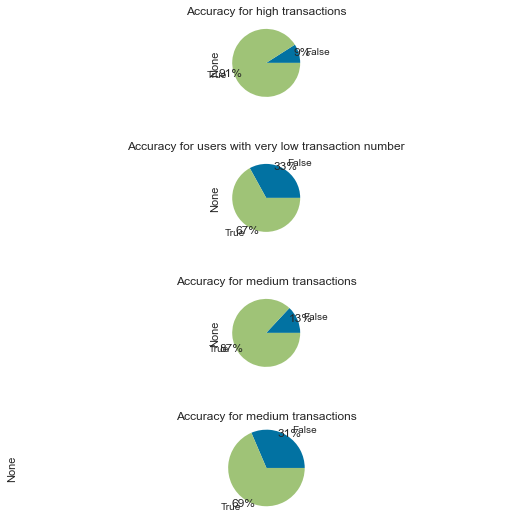

In [182]:
fig, axes = plt.subplots(4, figsize=(8, 8))

axes[0].set_title('Accuracy for high transactions')
predictions[predictions['total_transaction']> -0.101730].groupby(predictions.is_true_predicted).size().plot(kind='pie', ax= axes[0], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

axes[1].set_title('Accuracy for users with very low transaction number')
predictions[predictions['total_transaction']< -0.252220].groupby(predictions.is_true_predicted).size().plot(kind='pie', ax= axes[1], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

axes[2].set_title('Accuracy for medium transactions')
predictions[predictions['total_transaction']> -0.225616].groupby(predictions.is_true_predicted).size().plot(kind='pie', ax= axes[2], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

axes[3].set_title('Accuracy for medium transactions')
predictions[predictions['total_transaction']< -0.225616].groupby(predictions.is_true_predicted).size().plot(kind='pie', ax= axes[3], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

plt.tight_layout(pad=3);

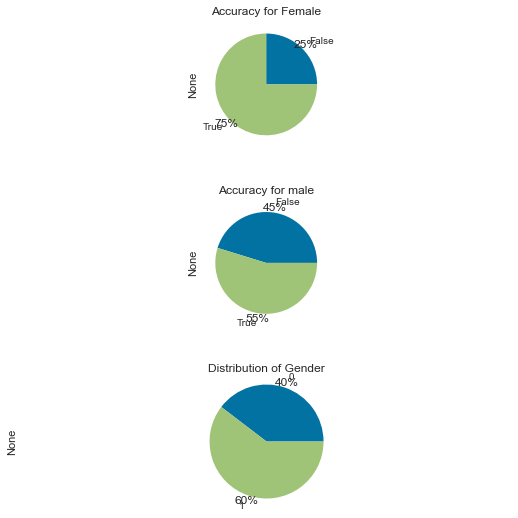

In [185]:
fig, axes = plt.subplots(3, figsize=(8, 8))

axes[0].set_title('Accuracy for Female')
predictions[(predictions['label']==1) & (predictions['total_transaction']< -0.252220)].groupby(predictions.is_true_predicted).size().plot(kind='pie', ax= axes[0], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

axes[1].set_title('Accuracy for male')
predictions[(predictions['label']==0) & ( predictions['total_transaction']< -0.252220)].groupby(predictions.is_true_predicted).size().plot(kind='pie', ax= axes[1], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

axes[2].set_title('Distribution of Gender')
predictions[predictions['total_transaction']< -0.252220].groupby(predictions.label).size().plot(kind='pie', ax= axes[2], autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.axis('equal')

plt.tight_layout(pad=3);

In [246]:
user_vs_action_in_promotion = pd.merge(user_vs_action_in_promotion, user_features[['gender', 'unique_id']], on = 'unique_id', how = 'left')

In [247]:
user_vs_action_in_promotion.replace([np.inf, -np.inf], np.nan, inplace=True)
X = user_vs_action_in_promotion.drop(columns = ['gender']).fillna(0)
y = user_vs_action_in_promotion.gender

# logistic regression 

from sklearn.linear_model import LogisticRegressionCV
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X)
X_scaled = scaler.transform(X)

model1 = LogisticRegressionCV(cv=10, random_state=0,
                              max_iter = 3000).fit(X_scaled, y)

model1.score(X_scaled,y) # 0.7983

0.6548593805624777

In [260]:
v1_and_v2 = pd.merge(user_vs_action, user_vs_action_in_promotion, on = 'unique_id', how = 'left')

In [279]:
feature_list_1 =  user_vs_action.columns.tolist()

feature_list_1.remove("gender")

In [276]:
feature_list_1 =  user_vs_action_in_promotion.columns.tolist()

feature_list_1.remove("gender")

In [280]:
v1_and_v2.replace([np.inf, -np.inf], np.nan, inplace=True)
#X = v1_and_v2.drop(columns = ['gender_x', 'gender_y']).fillna(0)
X = v1_and_v2[feature_list_1].fillna(0)
y = v1_and_v2.gender_x

# logistic regression 

from sklearn.linear_model import LogisticRegressionCV
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X)
X_scaled = scaler.transform(X)

model1 = LogisticRegressionCV(cv=10, random_state=0,
                              max_iter = 3000).fit(X_scaled, y)

model1.score(X_scaled,y) # 0.7983

0.663937344250623

In [ ]:
# promotion days analysis

# promotion 1 = 09-12 kasım indirimleri
# promotion 2 = 25-26-27 kasım indirimleri

In [200]:
user_vs_action_pgender_in_promotion = train.copy()

user_vs_action_pgender_in_promotion["in_promotion"]  = user_vs_action_pgender_in_promotion["date"].isin(["2020-11-09", "2020-11-10", "2020-11-11", "2020-11-12", "2020-11-25", "2020-11-26", "2020-11-27" ])


user_vs_action_pgender_in_promotion= user_vs_action_pgender_in_promotion.groupby(by=['unique_id','in_promotion', 'product_gender'], as_index=False, dropna = False).size()
user_vs_action_pgender_in_promotion.product_gender = user_vs_action_pgender_in_promotion.product_gender.fillna('NotDefined')

user_vs_action_pgender_in_promotion = user_vs_action_pgender_in_promotion.pivot_table('size', ['unique_id'], ['product_gender','in_promotion'])

list = []
for x in user_vs_action_pgender_in_promotion.columns:
    str_x = 'no_promo'
    if x[1]:
        str_x = "promo"       
    list.append(x[0] + '_'+ str_x )
user_vs_action_pgender_in_promotion.columns = list

v1_v2 = user_vs_action_pgender_in_promotion.copy()

v1_v2 = v1_v2.fillna(0)

for x in user_vs_action_pgender_in_promotion.columns:
    if x == 'unique_id':
        continue
    if x.split('_')[1] == 'no':
        v1_v2[x + '_percent'] = (
    v1_v2[x] / (v1_v2[x] +  v1_v2[x.split('_')[0] + '_promo']))
        
    if x.split('_')[1] == 'promo':
        v1_v2[x + '_percent'] = (
    v1_v2[x] / (v1_v2[x] +  v1_v2[x.split('_')[0] + '_no_promo']))

In [18]:
v1_v2

,Erkek_no_promo,Erkek_promo,Kadın_no_promo,Kadın_promo,NotDefined_no_promo,NotDefined_promo,Unisex_no_promo,Unisex_promo,Erkek_no_promo_percent,Erkek_promo_percent,Kadın_no_promo_percent,Kadın_promo_percent,NotDefined_no_promo_percent,NotDefined_promo_percent,Unisex_no_promo_percent,Unisex_promo_percent
unique_id,,,,,,,,,,,,,,,,
1,48.0,2.0,430.0,202.0,490.0,140.0,1414.0,514.0,0.960000,0.040000,0.680380,0.319620,0.777778,0.222222,0.733402,0.266598
2,40.0,0.0,1900.0,1010.0,398.0,138.0,1102.0,648.0,1.000000,0.000000,0.652921,0.347079,0.742537,0.257463,0.629714,0.370286
3,0.0,0.0,1468.0,0.0,48.0,0.0,60.0,0.0,NaN,NaN,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
4,966.0,18.0,21168.0,2910.0,2406.0,150.0,4950.0,372.0,0.981707,0.018293,0.879143,0.120857,0.941315,0.058685,0.930101,0.069899
5,85.0,0.0,11520.0,3240.0,285.0,255.0,3420.0,1770.0,1.000000,0.000000,0.780488,0.219512,0.527778,0.472222,0.658960,0.341040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7991,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000
7992,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000
7995,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,0.000000,1.000000,NaN,NaN


In [203]:
for x in user_vs_action_pgender_in_promotion.columns:
    if x == 'unique_id':
        continue
    for y in user_vs_action_pgender_in_promotion.columns:
        if y == 'unique_id':
            continue
        if x == y:
            continue
        v1_v2[x + '_over_' + y] = (
        v1_v2[x] / v1_v2[y]) 

for x in user_vs_action_pgender_in_promotion.columns:
    if x == 'unique_id':
        continue
    for y in user_vs_action_pgender_in_promotion.columns:
        if y == 'unique_id':
            continue
        if x == y:
            continue
        v1_v2[x + '_perc_times_' + y + '_perc'] = (
        v1_v2[x + '_percent'] * v1_v2[y + '_percent']) 

/var/folders/w7/prlcb1cx2rx2jwdcq4ftbmk40000gn/T/ipykernel_9122/2035909921.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  v1_v2[x + '_perc_times_' + y + '_perc'] = (


In [204]:
v1_v2_ = pd.merge(user_features, v1_v2, on= 'unique_id', how = 'left')

In [205]:
v1_v2_['total_transaction_no_promo'] =  (v1_v2_['Erkek_no_promo'] 
                                        + v1_v2_['Kadın_no_promo'] 
                                        + v1_v2_['NotDefined_no_promo'] 
                                        + v1_v2_['Unisex_no_promo'] )
v1_v2_['total_transaction_promo'] =  (v1_v2_['Erkek_promo'] 
                                        + v1_v2_['Kadın_promo'] 
                                        + v1_v2_['NotDefined_promo'] 
                                        + v1_v2_['Unisex_promo'] )
v1_v2_['promo_percent'] = v1_v2_['total_transaction_promo'] / v1_v2_['total_transaction']
v1_v2_['no_promo_percent'] = v1_v2_['total_transaction_no_promo'] / v1_v2_['total_transaction']

In [ ]:
feature_list_1 =  user_features.columns.tolist()

feature_list_1.remove("gender")

In [401]:
feature_list_2 = feature_list_1 + ['Erkek_no_promo_percent',
 'Erkek_promo_percent',
 'Kadın_no_promo_percent',
 'Kadın_promo_percent',
 'NotDefined_no_promo_percent',
 'NotDefined_promo_percent',
 'Unisex_no_promo_percent',
 'Unisex_promo_percent',
'promo_percent',
 'no_promo_percent']

In [404]:
v1_v2_.replace([np.inf, -np.inf], np.nan, inplace=True)
#X = v1_v2_.drop(columns = ['gender']).fillna(0)
X = v1_v2_[feature_list_1].fillna(0)
y = v1_v2_.gender

# logistic regression 

from sklearn.linear_model import LogisticRegressionCV
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X)
X_scaled = scaler.transform(X)

model1 = LogisticRegressionCV(cv=10, random_state=0,
                              max_iter = 3000).fit(X_scaled, y)

model1.score(X_scaled,y) # 0.7983

0.7981488074047703

In [206]:
v1_v2_.replace([np.inf, -np.inf], np.nan, inplace=True)
X = v1_v2_.drop(columns = ['gender']).fillna(0)
#X = v1_v2_[feature_list_1].fillna(0)
y = v1_v2_.gender

# logistic regression 

from sklearn.linear_model import LogisticRegressionCV
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X)
X_scaled = scaler.transform(X)

model1 = LogisticRegressionCV(cv=10, random_state=0,
                              max_iter = 3000).fit(X_scaled, y)

model1.score(X_scaled,y) # 0.7983

0.8031327874688501

# PCA Denemeleri 
# input data has 984 columns. Model Accuracy is %80,31
# I want to know the model accuracy with smaller complexity input data 
# when we have %90 variance explained by PCA. It is smaller, checked. 


In [ ]:
from sklearn.decomposition import PCA
# Make an instance of the Model
pca = PCA(n_components = 20)
pca.fit(X_scaled)

X_scaled = pca.transform(X_scaled)


X_scaled.shape

model1 = LogisticRegressionCV(cv=10, random_state=0,
                              max_iter = 3000).fit(X_scaled, y)

model1.score(X_scaled,y) # 0.7983

# CATEGORY NAMES IN DATA 

In [64]:
train.head(2).T

,0,1
time_stamp,2020-12-02 22:26:14.023000+00:00,2020-12-08 23:15:04.603000+00:00
contentid,39918893.0,3558544.0
user_action,favorite,favorite
sellingprice,3099.0,3079.0
product_name,PerfectCare 600 EW6F449ST A+++ 9 KG 1400 Devir...,WW90J5475FW A+++ 1400 Devir 9 kg Çamaşır Makinesi
brand_id,8511.0,3228.0
brand_name,Electrolux,Samsung
businessunit,Beyaz Eşya,Beyaz Eşya
product_gender,Unisex,NaN
category_id,1272.0,1272.0


In [4]:
products = train[['Level1_Category_Name',
                          'Level2_Category_Name',
                          'Level3_Category_Name',
                          'product_gender',
                         'contentid',
                         'product_name',
                         'brand_name',
                         'businessunit']].drop_duplicates()

In [5]:
train_filtered = pd.concat([train[train['gender'] == 'M'],train[train['gender'] == 'F'].sample(frac = 0.1944)], axis = 0)

In [237]:
# Change: groupby state_office and divide by sum
(train_filtered
 .groupby([
          'product_gender',
           'gender'], dropna = False)
 .agg({"time_stamp": pd.Series.nunique})
 .groupby([
          'product_gender'])
 .apply(lambda x: x / float(x.sum())))

time_stamp
product_gender gender            
Erkek          F         0.152371
               M         0.847629
Kadın          F         0.769853
               M         0.230147
Unisex         F         0.469721
               M         0.530279
NaN            F         0.449718
               M         0.550282

In [ ]:
['Level1_Category_Name']=='Anne & Bebek & Çocuk')
Level2_Category_Name = Bebek Giyim

In [236]:
# Change: groupby state_office and divide by sum
(train_filtered
 .groupby(['Level1_Category_Name',
          'Level2_Category_Name',
          'Level3_Category_Name',
          'product_gender',
           'gender'], dropna = False)
 .agg({"time_stamp": pd.Series.nunique})
 .groupby(['Level1_Category_Name',
          'Level2_Category_Name',
          'Level3_Category_Name',
          'product_gender'])
 .apply(lambda x: x / float(x.sum())))

time_stamp
Level1_Category_Name     Level2_Category_Name          Level3_Category_Name           product_gender gender            
Aksesuar                 Aksesuar Set                  Aksesuar Set                   NaN            F         0.055556
                                                                                                     M         0.944444
                         Altın                         Cumhuriyet Altını              Kadın          F         0.111111
                                                                                                     M         0.888889
                                                       Gram Altın                     Kadın          F         0.450000
                                                                                                     M         0.550000
                                                                                      Unisex         F         0.400000
                                                                                                     M         0.600000
                                                       Gram Gümüş                     NaN            F         0.250000
                                                                                                     M         0.750000
                                                       Reşat Altın                    Kadın          F         1.000000
                                                       Tam Altın                      Kadın          F         0.222222
                                                                                                     M         0.777778
                                                                                      Unisex         M         1.000000
                                                       Yarım Altın                    Kadın          M         1.000000
                                                       Yatırımlık Altın Bilezik       Erkek          F         1.000000
                                                                                      Kadın          F         0.592593
                                                                                                     M         0.407407
                                                                                      Unisex         F         0.772727
                                                                                                     M         0.227273
                                                       Çeyrek Altın                   Kadın          F         0.452991
                                                                                                     M         0.547009
                                                                                      Unisex         F         0.142857
                                                                                                     M         0.857143
                         Atkı & Bere & Eldiven         Atkı                           Erkek          F         0.194444
                                                                                                     M         0.805556
                                                                                      Kadın          F         0.821277
                                                                                                     M         0.178723
                                                                                      Unisex         F         0.642857
                                                                                                     M         0.357143
                                                       Atkı & Bere & Eldiven Set      Erkek          F         0.075221
                                                                                                     M         0.924779
                             

In [249]:
# Change: groupby state_office and divide by sum
(train_filtered
 .groupby(['Level1_Category_Name',
          'product_gender',
           'gender'], dropna = False)
 .agg({"time_stamp": pd.Series.nunique})
 .groupby(['Level1_Category_Name',
          'product_gender'])
 .apply(lambda x: x / float(x.sum())))

time_stamp
Level1_Category_Name     product_gender gender            
Aksesuar                 Erkek          F         0.139368
                                        M         0.860632
                         Kadın          F         0.746206
                                        M         0.253794
                         Unisex         F         0.390457
                                        M         0.609543
                         NaN            F         0.657960
                                        M         0.342040
Anne & Bebek & Çocuk     Erkek          F         0.513699
                                        M         0.486301
                         Kadın          F         0.721248
                                        M         0.278752
                         Unisex         F         0.572105
                                        M         0.427895
                         NaN            F         0.578614
                                        M         0.421386
Ayakkabı                 Erkek          F         0.111425
                                        M         0.888575
                         Kadın          F         0.748355
                                        M         0.251645
                         Unisex         F         0.269943
                                        M         0.730057
                         NaN            F         0.909091
                                        M         0.090909
Elektronik               Erkek          F         0.147268
                                        M         0.852732
                         Kadın          F         0.738944
                                        M         0.261056
                         Unisex         F         0.334326
                                        M         0.665674
                         NaN            F         0.278422
                                        M         0.721578
Ev & Mobilya             Erkek          F         0.405694
                                        M         0.594306
                         Kadın          F         0.679269
                                        M         0.320731
                         Unisex         F         0.588115
                                        M         0.411885
                         NaN            F         0.582998
                                        M         0.417002
Giyim                    Erkek          F         0.164749
                                        M         0.835251
                         Kadın          F         0.780213
                                        M         0.219787
                         Unisex         F         0.413316
                                        M         0.586684
                         NaN            F         0.500000
                                        M         0.500000
Kozmetik & Kişisel Bakım Erkek          F         0.175345
                                        M         0.824655
                         Kadın          F         0.813911
                                        M         0.186089
                         Unisex         F         0.610227
                                        M         0.389773
                         NaN            F         0.663282
                                        M         0.336718
Spor & Outdoor           Erkek          F         0.095314
                                        M         0.904686
                         Kadın          F         0.636425
                                        M         0.363575
                         Unisex         F         0.304566
                                        M         0.695434
                         NaN            F         0.247451
                                        M         0.752549
Süpermarket              Erkek          F         0.226545
                                        M         0.773455
                         Kadın      

In [263]:
products[products['Level3_Category_Name'] == 'Bot & Bootie']

,Level1_Category_Name,Level2_Category_Name,Level3_Category_Name,product_gender,contentid,product_name,brand_name,businessunit
110,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,3458545.0,Siyah Kadın Bot G0417259109,Bambi,Branded Shoes B
112,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,32193792.0,Hakiki Deri Kadın Siyah Bot K07530708,Bambi,Branded Shoes B
113,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,3459081.0,Siyah Kadın Bot G0447400209,Bambi,Branded Shoes B
115,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,32192524.0,Siyah Kadın Bot & Bootie K05017103,Bambi,Branded Shoes B
116,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,32194001.0,Kadın Siyah Bot K05324002,Bambi,Branded Shoes B
117,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,32194008.0,Siyah Kadın Bot & Bootie K06740505,Bambi,Branded Shoes B
125,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,55737227.0,Siyah Kadın Bot,Bambi,Branded Shoes B
312,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,32281307.0,Siyah Kadın Bot & Bootie K05160418,Bambi,Branded Shoes B
315,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,31638952.0,Kadın Vizon Bot G572442002,Fox Shoes,Branded Shoes B
490,Ayakkabı,Bot & Çizme,Bot & Bootie,Kadın,34460558.0,Hakiki Deri Sıyah Kadın Bot & Bootie K07513280,Bambi,Branded Shoes B


In [84]:
train[train['contentid']==48168289]

,time_stamp,contentid,user_action,sellingprice,product_name,brand_id,brand_name,businessunit,product_gender,category_id,...,Level3_Category_Id,Level3_Category_Name,gender,unique_id,type,month,dayOfMonth,dayofWeek,hour,date
5477152,2020-11-26 10:54:36+00:00,48168289.0,search,92.0,230x250 Balkon Perdesi Balkon Brandası Koyu Kr...,988794.0,ALTINPAMUK,Bahçe & Yapı Market & Hırdavat,Unisex,1989.0,...,2905.0,Motosiklet,F,4618,train,11,26,Thursday,10,2020-11-26
5478353,2020-11-26 10:54:36+00:00,48168289.0,search,92.0,230x250 Balkon Perdesi Balkon Brandası Koyu Kr...,988794.0,ALTINPAMUK,Bahçe & Yapı Market & Hırdavat,Unisex,1989.0,...,2905.0,Motosiklet,F,4618,train,11,26,Thursday,10,2020-11-26


In [88]:
train_filtered[train_filtered['Level3_Category_Name'] == 'Yatırımlık Altın Bilezik'].groupby('gender').size()

gender
F    763
M     77
dtype: int64

# Category visualization analysis

In [13]:
gender_stats = (train_filtered
 .groupby(['Level1_Category_Name',
          'Level2_Category_Name',
          'Level3_Category_Name',
          'businessunit',  
          'product_gender',
           'gender'], dropna = False)
 .agg({"time_stamp": pd.Series.nunique})
 .groupby(['Level1_Category_Name',
          'Level2_Category_Name',
          'Level3_Category_Name',
          'businessunit',
          'product_gender'], dropna = False,
                    as_index=False)
 .apply(lambda x: x / float(x.sum()))
               )
gender_stats = gender_stats.reset_index().fillna('NotDefined')
gender_stats = gender_stats[gender_stats['gender']=='M']

In [14]:
gender_stats

,Level1_Category_Name,Level2_Category_Name,Level3_Category_Name,businessunit,product_gender,gender,time_stamp
1,Aksesuar,Aksesuar Set,Aksesuar Set,Diğer Aksesuarlar,NotDefined,M,0.888889
2,Aksesuar,Aksesuar Set,Aksesuar Set,Ev Dekorasyon,NotDefined,M,1.000000
4,Aksesuar,Aksesuar Set,Aksesuar Set,Mücevher,NotDefined,M,1.000000
5,Aksesuar,Aksesuar Set,Aksesuar Set,Saat B,NotDefined,M,1.000000
6,Aksesuar,Aksesuar Set,Aksesuar Set,Takı,NotDefined,M,1.000000
...,...,...,...,...,...,...,...
8356,Yaşam,Otomobil & Motosiklet,Otomobil,Outdoor Equipment,Unisex,M,0.714286
8357,Yaşam,Otomobil & Motosiklet,Otomobil,Outdoor Equipment,NotDefined,M,1.000000
8360,Yaşam,Otomobil & Motosiklet,Otomobil,TV & Görüntü Ses Sistemleri,Unisex,M,1.000000
8361,Yaşam,Otomobil & Motosiklet,Otomobil,TV & Görüntü Ses Sistemleri,NotDefined,M,1.000000


In [30]:
cols = ['businessunit',
        'Level1_Category_Name',
        'Level2_Category_Name',
        'Level3_Category_Name',
        'product_gender',
        'gender']
cols[0:len(cols)-1]

['businessunit',
 'Level1_Category_Name',
 'Level2_Category_Name',
 'Level3_Category_Name',
 'product_gender']

In [20]:
cols[0] +"_" +  cols[1].split("_")[0]

'businessunit_Level1'

In [25]:
col_name = "1"
for i in range(len(cols[0:len(cols)-2])):
        col_name = col_name + "_" + cols[i].split("_")[0]
col_name

'1_businessunit_Level1_Level2_Level3'

In [56]:
def generate_data(train_filtered, cols):
    gender_stats = (train_filtered
     .groupby(cols, dropna = False)
     .agg({"time_stamp": pd.Series.nunique})
     .groupby(cols[0:len(cols)-1], dropna = False,
                        as_index=False)
     .apply(lambda x: x / float(x.sum()))
                   )
    gender_stats = gender_stats.reset_index().fillna('NotDefined')
    gender_stats = gender_stats[gender_stats['gender']=='M'].drop(columns=['gender'])
    col_name = "1"
    for i in range(len(cols[0:len(cols)-2])):
            col_name = col_name + "_" + cols[i].split("_")[0]
    gender_stats.rename({'time_stamp': col_name}, axis=1, inplace=True)
    return gender_stats

In [36]:
cols.remove(cols[len(cols)-3])

In [57]:
cols = ['businessunit',
        'Level1_Category_Name',
        'Level2_Category_Name',
        'Level3_Category_Name',
        'product_gender',
        'gender']

for i in range(len(cols)):   
    if len(cols) == 2:
        break
    print(i)
    j_data = generate_data(train_filtered, cols)
    product_counts = pd.merge(product_counts, j_data, on = cols[0:len(cols)-1], how = 'left')
    cols.remove(cols[len(cols)-3])
    


0
1
2
3


In [58]:
cols = [
        'Level1_Category_Name',
        'Level2_Category_Name',
        'Level3_Category_Name',
        'businessunit',
        'product_gender',
        'gender']

for i in range(len(cols)):  
    cols.remove(cols[len(cols)-3])
    if len(cols) == 2:
        break
    print(i)
    j_data = generate_data(train_filtered, cols)
    product_counts = pd.merge(product_counts, j_data, on = cols[0:len(cols)-1], how = 'left')
    
    


0
1
2


In [59]:
product_counts

,Level1_Category_Name,Level2_Category_Name,Level3_Category_Name,businessunit,product_gender,product_count,1_businessunit_Level1_Level2_Level3,1_businessunit_Level1_Level2,1_businessunit_Level1,1_businessunit,1_Level1_Level2_Level3,1_Level1_Level2,1_Level1
0,Aksesuar,Aksesuar Set,Aksesuar Set,Diğer Aksesuarlar,NotDefined,5,0.888889,0.888889,0.159420,0.404545,0.772727,0.772727,0.310034
1,Aksesuar,Aksesuar Set,Aksesuar Set,Ev Dekorasyon,NotDefined,2,1.000000,1.000000,1.000000,0.406369,0.772727,0.772727,0.310034
2,Aksesuar,Aksesuar Set,Aksesuar Set,Mayo,NotDefined,14,NaN,NaN,NaN,NaN,0.772727,0.772727,0.310034
3,Aksesuar,Aksesuar Set,Aksesuar Set,Mücevher,NotDefined,10,1.000000,1.000000,0.222222,0.222222,0.772727,0.772727,0.310034
4,Aksesuar,Aksesuar Set,Aksesuar Set,Saat B,NotDefined,1,1.000000,1.000000,0.500000,0.428571,0.772727,0.772727,0.310034
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6733,Yaşam,Otomobil & Motosiklet,Otomobil,TV & Görüntü Ses Sistemleri,Unisex,1,1.000000,1.000000,1.000000,1.000000,0.887279,0.889606,0.589207
6734,Yaşam,Otomobil & Motosiklet,Otomobil,TV & Görüntü Ses Sistemleri,NotDefined,2,1.000000,1.000000,1.000000,0.755382,0.888549,0.888526,0.610527
6735,Yaşam,Otomobil & Motosiklet,Otomobil,Çanta & Valiz,NotDefined,1,NaN,NaN,NaN,0.295255,0.888549,0.888526,0.610527
6736,Yaşam,Otomobil & Motosiklet,Otomobil,Çocuk Gereç,NotDefined,4,NaN,NaN,NaN,0.340237,0.888549,0.888526,0.610527


In [55]:
# Change: groupby state_office and divide by sum
product_counts = (products
 .groupby(['Level1_Category_Name',
          'Level2_Category_Name',
          'Level3_Category_Name',
          'businessunit',  
          'product_gender'], dropna = False,
                    as_index=False)
 .agg({ "contentid": pd.Series.nunique})
).fillna('NotDefined')
product_counts.columns = ['Level1_Category_Name',
          'Level2_Category_Name',
          'Level3_Category_Name',
          'businessunit',  
          'product_gender',
          'product_count']

In [99]:
def generate_counts(products, cols):
    product_counts = (products
             .groupby(cols[0:len(cols)-1], dropna = False,
                                as_index=False)
             .agg({ "contentid": pd.Series.nunique})
            ).fillna('NotDefined')
    product_counts.columns = cols
    col_name = "count"
    for i in range(len(cols[0:len(cols)-2])):
            col_name = col_name + "_" + cols[i].split("_")[0]
    product_counts.rename({'product_count': col_name}, axis=1, inplace=True)
    return product_counts

In [101]:
cols = [
        'Level1_Category_Name',
        'Level2_Category_Name',
        'Level3_Category_Name',
        'businessunit',
        'product_gender',
        'product_count']

for i in range(len(cols)):  
    cols.remove(cols[len(cols)-3])
    if len(cols) == 2:
        break
    print(i)
    j_data = generate_counts(products, cols)
    product_counts = pd.merge(product_counts, j_data, on = cols[0:len(cols)-1], how = 'left')

0
1
2


In [102]:
product_counts

,Level1_Category_Name,Level2_Category_Name,Level3_Category_Name,businessunit,product_gender,product_count,1_businessunit_Level1_Level2_Level3,1_businessunit_Level1_Level2,1_businessunit_Level1,1_businessunit,1_Level1_Level2_Level3,1_Level1_Level2,1_Level1,count_Level1_Level2_Level3,count_Level1_Level2,count_Level1
0,Aksesuar,Aksesuar Set,Aksesuar Set,Diğer Aksesuarlar,NotDefined,5,0.888889,0.888889,0.159420,0.404545,0.772727,0.772727,0.310034,33,33,831
1,Aksesuar,Aksesuar Set,Aksesuar Set,Ev Dekorasyon,NotDefined,2,1.000000,1.000000,1.000000,0.406369,0.772727,0.772727,0.310034,33,33,831
2,Aksesuar,Aksesuar Set,Aksesuar Set,Mayo,NotDefined,14,NaN,NaN,NaN,NaN,0.772727,0.772727,0.310034,33,33,831
3,Aksesuar,Aksesuar Set,Aksesuar Set,Mücevher,NotDefined,10,1.000000,1.000000,0.222222,0.222222,0.772727,0.772727,0.310034,33,33,831
4,Aksesuar,Aksesuar Set,Aksesuar Set,Saat B,NotDefined,1,1.000000,1.000000,0.500000,0.428571,0.772727,0.772727,0.310034,33,33,831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6733,Yaşam,Otomobil & Motosiklet,Otomobil,TV & Görüntü Ses Sistemleri,Unisex,1,1.000000,1.000000,1.000000,1.000000,0.887279,0.889606,0.589207,1389,1681,18135
6734,Yaşam,Otomobil & Motosiklet,Otomobil,TV & Görüntü Ses Sistemleri,NotDefined,2,1.000000,1.000000,1.000000,0.755382,0.888549,0.888526,0.610527,2247,2316,13366
6735,Yaşam,Otomobil & Motosiklet,Otomobil,Çanta & Valiz,NotDefined,1,NaN,NaN,NaN,0.295255,0.888549,0.888526,0.610527,2247,2316,13366
6736,Yaşam,Otomobil & Motosiklet,Otomobil,Çocuk Gereç,NotDefined,4,NaN,NaN,NaN,0.340237,0.888549,0.888526,0.610527,2247,2316,13366


In [103]:
from sklearn import preprocessing
product_counts.replace([np.inf, -np.inf], np.nan, inplace=True)
X = product_counts.drop(columns = ['Level1_Category_Name',
          'Level2_Category_Name',
          'Level3_Category_Name',
          'businessunit',  
          'product_gender']).fillna(0)

scaler = preprocessing.StandardScaler().fit(X)
X_scaled = scaler.transform(X)

In [104]:
from sklearn.decomposition import PCA
pca = PCA()
Xt = pca.fit_transform(X_scaled)

In [ ]:
plt.figure(figsize=(16,8))

pd_y = pd.DataFrame(y)
pd_y['label'] = (pd_y['gender'] == 'F')
pd_y['label'] = (pd_y['label']).astype(int)

plot = plt.scatter(Xt[:,0], Xt[:,1], c=pd_y['label'])
plt.legend(handles=plot.legend_elements()[0], labels=['F', 'M'])
plt.show()

In [68]:
pca.explained_variance_ratio_.reshape(8,1).cumsum()

array([0.59788256, 0.72667918, 0.82735275, 0.90219032, 0.93683934,
       0.96557238, 0.9863684 , 1.        ])

In [67]:
pca.explained_variance_ratio_

array([0.59788256, 0.12879662, 0.10067357, 0.07483757, 0.03464902,
       0.02873303, 0.02079602, 0.0136316 ])

In [105]:
from sklearn.manifold import TSNE

# sample 3000 data point because of time concerns
tsne = TSNE(n_components=2, verbose=1, n_iter=1000)
tsne_results = tsne.fit_transform(X_scaled)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6738 samples in 0.005s...
[t-SNE] Computed neighbors for 6738 samples in 0.708s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6738
[t-SNE] Computed conditional probabilities for sample 2000 / 6738
[t-SNE] Computed conditional probabilities for sample 3000 / 6738
[t-SNE] Computed conditional probabilities for sample 4000 / 6738
[t-SNE] Computed conditional probabilities for sample 5000 / 6738
[t-SNE] Computed conditional probabilities for sample 6000 / 6738
[t-SNE] Computed conditional probabilities for sample 6738 / 6738
[t-SNE] Mean sigma: 0.463619
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.388504
[t-SNE] KL divergence after 1000 iterations: 1.056580


/var/folders/w7/prlcb1cx2rx2jwdcq4ftbmk40000gn/T/ipykernel_14627/232392300.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_y['tsne-2d-one'] = tsne_results[:,0]
/var/folders/w7/prlcb1cx2rx2jwdcq4ftbmk40000gn/T/ipykernel_14627/232392300.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_y['tsne-2d-two'] = tsne_results[:,1]


<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

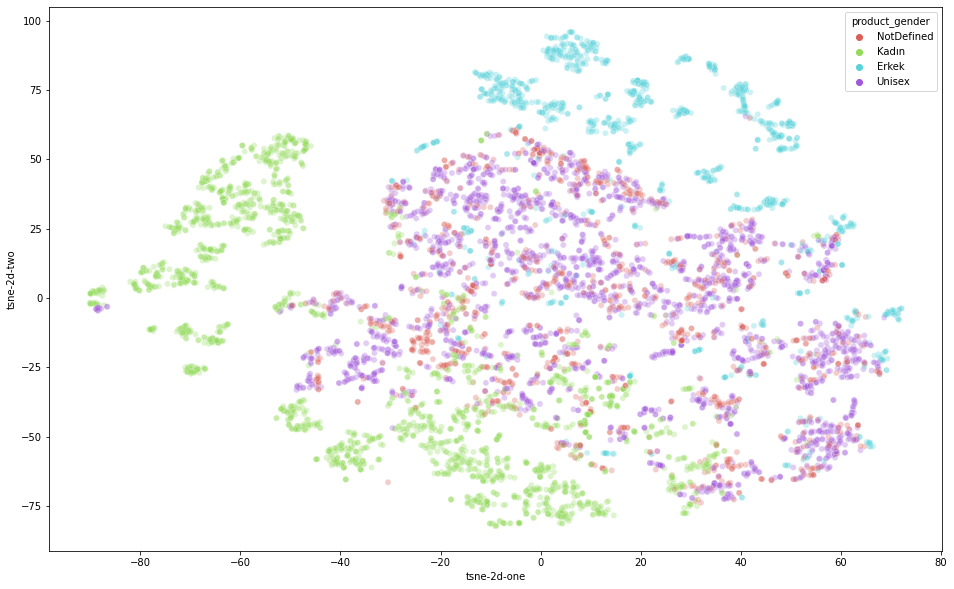

In [106]:
pd_y = product_counts[['Level1_Category_Name',
          'Level2_Category_Name',
          'Level3_Category_Name',
          'businessunit',  
          'product_gender']]
pd_y['tsne-2d-one'] = tsne_results[:,0]
pd_y['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="product_gender",
    palette=sns.color_palette("hls", 4),
    data=pd_y,
    legend="full",
    alpha=0.3
)



In [91]:
pd_y

,Level1_Category_Name,Level2_Category_Name,Level3_Category_Name,businessunit,product_gender,tsne-2d-one,tsne-2d-two
0,Aksesuar,Aksesuar Set,Aksesuar Set,Diğer Aksesuarlar,NotDefined,72.981346,-41.326576
1,Aksesuar,Aksesuar Set,Aksesuar Set,Ev Dekorasyon,NotDefined,90.141136,-24.953060
2,Aksesuar,Aksesuar Set,Aksesuar Set,Mayo,NotDefined,-98.084496,31.460215
3,Aksesuar,Aksesuar Set,Aksesuar Set,Mücevher,NotDefined,72.671867,-41.446865
4,Aksesuar,Aksesuar Set,Aksesuar Set,Saat B,NotDefined,73.229813,-40.228909
...,...,...,...,...,...,...,...
6733,Yaşam,Otomobil & Motosiklet,Otomobil,TV & Görüntü Ses Sistemleri,Unisex,102.242371,26.854288
6734,Yaşam,Otomobil & Motosiklet,Otomobil,TV & Görüntü Ses Sistemleri,NotDefined,100.171692,26.869005
6735,Yaşam,Otomobil & Motosiklet,Otomobil,Çanta & Valiz,NotDefined,-106.907227,39.346581
6736,Yaşam,Otomobil & Motosiklet,Otomobil,Çocuk Gereç,NotDefined,-107.226349,39.532055


In [107]:
(pd.concat([product_counts, pd_y], axis = 1)).to_csv( "categorical_analysis.csv")

In [ ]:
transaction_counts = (train
 .groupby(products.columns.tolist(), dropna = False,
                    as_index=False)
 .agg({"time_stamp": pd.Series.nunique})
)

transaction_counts_by_transaction = (train
 .groupby(products.columns.tolist() + ['user_action'], dropna = False,
                    as_index=False)
 .agg({"time_stamp": pd.Series.nunique})
)

In [147]:
transaction_counts_by_transaction.product_gender = transaction_counts_by_transaction.product_gender.fillna("NotDefined")

transaction_counts_by_transaction = transaction_counts_by_transaction.pivot_table('time_stamp', products.columns.tolist() , 'user_action')
transaction_counts_by_transaction.reset_index( drop=False, inplace=True ) 

transaction_counts_by_transaction = transaction_counts_by_transaction[products.columns.tolist() + ['basket', 'favorite', 'order', 'search', 'visit']]

transaction_counts_by_transaction = transaction_counts_by_transaction.fillna(0)

transaction_counts_by_transaction['total_transaction'] = (transaction_counts_by_transaction['basket'] + 
                                    transaction_counts_by_transaction['favorite'] +
                                    transaction_counts_by_transaction['search'] +
                                    transaction_counts_by_transaction['visit'] +
                                    transaction_counts_by_transaction['order'] )

products_filtered = transaction_counts_by_transaction[transaction_counts_by_transaction['total_transaction'] > 20]

In [153]:
products_filtered.product_gender.value_counts()

Kadın         8646
Unisex        3816
Erkek         1744
NotDefined    1401
Name: product_gender, dtype: int64

In [154]:
product_stats = (train_filtered
 .groupby(['contentid',
           'gender'], dropna = False)
 .agg({"time_stamp": pd.Series.nunique})
 .groupby(['contentid'], dropna = False,
                    as_index=False)
 .apply(lambda x: x / float(x.sum()))
               )
product_stats = product_stats.reset_index().fillna('NotDefined')
product_stats = product_stats[product_stats['gender']=='M'].drop(columns=['gender'])

In [ ]:
prod_data = pd.merge(products_filtered, product_stats, on ='contentid', how= 'left')

In [162]:
merged_data = pd.merge(prod_data, product_counts, on =['Level1_Category_Name',
          'Level2_Category_Name',
          'Level3_Category_Name',
          'businessunit',  
          'product_gender'], how= 'left')

In [163]:
merged_data

,Level1_Category_Name,Level2_Category_Name,Level3_Category_Name,product_gender,contentid,product_name,brand_name,businessunit,basket,favorite,...,1_businessunit_Level1_Level2_Level3,1_businessunit_Level1_Level2,1_businessunit_Level1,1_businessunit,1_Level1_Level2_Level3,1_Level1_Level2,1_Level1,count_Level1_Level2_Level3,count_Level1_Level2,count_Level1
0,Aksesuar,Altın,Gram Altın,Kadın,4422275.0,24 Ayar - 0.5g Altın,Ahlatcı,Mücevher,2.0,2.0,...,0.589286,0.504178,0.35917,0.35917,0.589286,0.504155,0.253730,45,230,28607
1,Aksesuar,Altın,Gram Altın,Kadın,4422282.0,24 Ayar - 1g Altın,Ahlatcı,Mücevher,3.0,2.0,...,0.589286,0.504178,0.35917,0.35917,0.589286,0.504155,0.253730,45,230,28607
2,Aksesuar,Altın,Gram Altın,Kadın,6040895.0,1 Adet 1 Gram 22 Ayar Gram Altın G000021,Tuğrul Kuyumculuk,Mücevher,4.0,3.0,...,0.589286,0.504178,0.35917,0.35917,0.589286,0.504155,0.253730,45,230,28607
3,Aksesuar,Altın,Gram Altın,Kadın,6040912.0,2 Adet 1 Gram 24 Ayar Gram Altın G000042,Tuğrul Kuyumculuk,Mücevher,2.0,0.0,...,0.589286,0.504178,0.35917,0.35917,0.589286,0.504155,0.253730,45,230,28607
4,Aksesuar,Altın,Gram Altın,Kadın,6040933.0,"2,5 Gram Külçe Gram Altın IAR 24 Ayar K000001",Tuğrul Kuyumculuk,Mücevher,2.0,0.0,...,0.589286,0.504178,0.35917,0.35917,0.589286,0.504155,0.253730,45,230,28607
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15602,Yaşam,Otomobil & Motosiklet,Otomobil,Unisex,45695695.0,Deprem Kiti,Clingston,Oto Aksesuar,5.0,2.0,...,0.888889,0.894755,0.89146,0.89063,0.887279,0.889606,0.589207,1389,1681,18135
15603,Yaşam,Otomobil & Motosiklet,Otomobil,Unisex,47141112.0,205/55r16 91v Premiumcontact 6,Continental,Oto Aksesuar,4.0,1.0,...,0.888889,0.894755,0.89146,0.89063,0.887279,0.889606,0.589207,1389,1681,18135
15604,Yaşam,Otomobil & Motosiklet,Otomobil,Unisex,47558441.0,Oil Pro-s Plus Onarıcı Heavy Duty 150.000 Km+ ...,snc,Oto Aksesuar,3.0,1.0,...,0.888889,0.894755,0.89146,0.89063,0.887279,0.889606,0.589207,1389,1681,18135
15605,Yaşam,Otomobil & Motosiklet,Otomobil,Unisex,50364270.0,185/60 R15h 88h Xl G Fıt 4 S Lh71 Bınek 4 Mevs...,Laufenn,Oto Aksesuar,2.0,0.0,...,0.888889,0.894755,0.89146,0.89063,0.887279,0.889606,0.589207,1389,1681,18135


In [157]:
prod_data.product_gender.value_counts(dropna=False)

Kadın         8646
Unisex        3816
Erkek         1744
NotDefined    1401
Name: product_gender, dtype: int64

In [164]:
from sklearn import preprocessing
merged_data.replace([np.inf, -np.inf], np.nan, inplace=True)
X = merged_data.drop(columns = products.columns.tolist()).fillna(0)

scaler = preprocessing.StandardScaler().fit(X)
X_scaled = scaler.transform(X)

In [165]:
# sample 3000 data point because of time concerns
tsne = TSNE(n_components=2, verbose=1, n_iter=1000)
tsne_results = tsne.fit_transform(X_scaled)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 15607 samples in 0.000s...
[t-SNE] Computed neighbors for 15607 samples in 4.029s...
[t-SNE] Computed conditional probabilities for sample 1000 / 15607
[t-SNE] Computed conditional probabilities for sample 2000 / 15607
[t-SNE] Computed conditional probabilities for sample 3000 / 15607
[t-SNE] Computed conditional probabilities for sample 4000 / 15607
[t-SNE] Computed conditional probabilities for sample 5000 / 15607
[t-SNE] Computed conditional probabilities for sample 6000 / 15607
[t-SNE] Computed conditional probabilities for sample 7000 / 15607
[t-SNE] Computed conditional probabilities for sample 8000 / 15607
[t-SNE] Computed conditional probabilities for sample 9000 / 15607
[t-SNE] Computed conditional probabilities for sample 10000 / 15607
[t-SNE] Computed conditional probabilities for sample 11000 / 15607
[t-SNE] Computed conditional probabilities for sample 12000 / 15607
[t-SNE] Computed conditional probabilities for sam

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

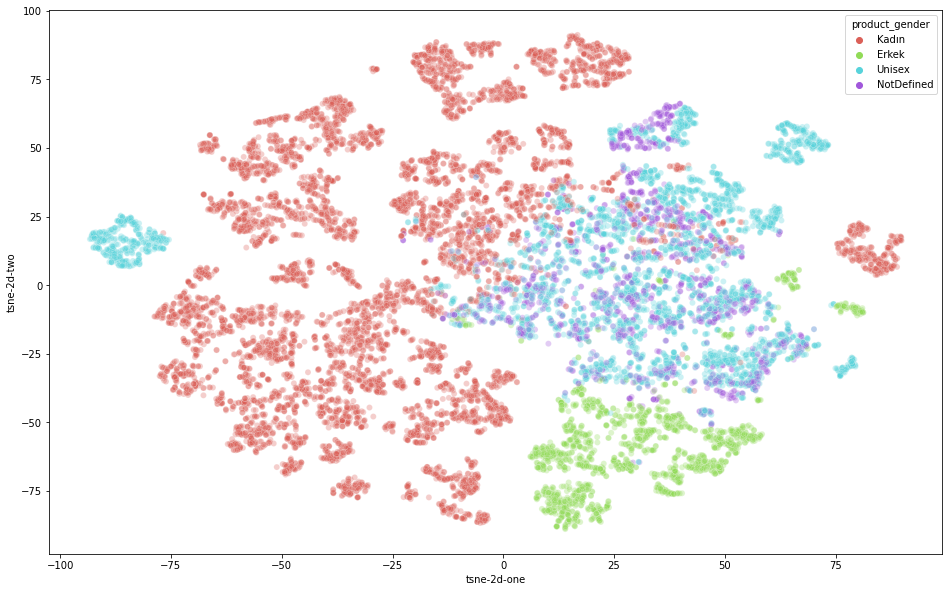

In [166]:
pd_y = prod_data[products.columns.tolist()].fillna('NotDefined')
pd_y['tsne-2d-one'] = tsne_results[:,0]
pd_y['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="product_gender",
    palette=sns.color_palette("hls", 4),
    data=pd_y,
    legend="full",
    alpha=0.3
)

Kadın     8646
Unisex    3816
Erkek     1744
Name: product_gender, dtype: int64

In [167]:
(pd.concat([prod_data, pd_y], axis = 1)).to_csv( "product_analysis.csv")